# Group C

## Group members: Eloise Habek, Luca Jimenez, Zoe Monnard, Valentina Pucci

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() #sets the matplotlib style to seaborn style

from scipy.io import loadmat 
from scipy.ndimage import convolve1d
from scipy.io import loadmat

np.random.seed(42)

# Part 1: Single subject classification (subject 1)

#### 1. Visualize and preprocess the data for subject 2 

#### Dataset Loading

In [2]:
# load EMG data
EMG_file_name = 's2/S2_A1_E1.mat'
data = loadmat(EMG_file_name)

emg=data["emg"]

print(f"keys: {[key for key in data.keys()]}")

emg_rectified = data["emg"].copy()

n_channels = emg_rectified.shape[1]
n_timepoints = emg_rectified.shape[0]

print(f"Number of channels: {n_channels} \nNumber of timepoints:{n_timepoints} ")

#Restimulus and rerepetition are the stimulus and repetition that have been processed for better correspondance to real movement
#Stimulus is the type of movement that is being performed
stimulus = data["restimulus"] 
#Repetition is the number of times the movement has been repeated
repetition = data["rerepetition"] 

print(f'EMG: {emg_rectified.shape}, \nStimulus {stimulus.shape}, \nRepetition {repetition.shape}')

keys: ['__header__', '__version__', '__globals__', 'subject', 'exercise', 'stimulus', 'emg', 'glove', 'restimulus', 'repetition', 'rerepetition']
Number of channels: 10 
Number of timepoints:100686 
EMG: (100686, 10), 
Stimulus (100686, 1), 
Repetition (100686, 1)


In [3]:
# -1 because 0 is the resting condition
n_stimuli = len(np.unique(stimulus)) - 1 
# -1 because 0 is not a repetition
n_repetitions = len(np.unique(repetition)) - 1 


print(f'Different types of movements: {n_stimuli}') 
print(f'Number of repetitions: {n_repetitions}') 

Different types of movements: 12
Number of repetitions: 10


In [4]:
number_of_samples_per_trial = np.zeros((n_stimuli, n_repetitions)) #12 x 10 matrix that will store the number of samples for each stimulus-repetition pair.

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        # stimulus == stimuli_idx+1: Finds all time points where the current stimulus is active.
        # repetition == repetition_idx+1: Finds all time points corresponding to the current repetition.
        idx = np.logical_and(stimulus == stimuli_idx+1, repetition == repetition_idx+1) # Combines the two conditions, identifying the indices where both the stimulus and repetition match.
        number_of_samples_per_trial[stimuli_idx, repetition_idx] = np.sum(idx.astype(int))

number_of_samples_per_trial

array([[307., 390., 262., 226., 418., 204., 196., 270., 306., 489.],
       [334., 323., 344., 309., 333., 376., 362., 307., 348., 339.],
       [465., 352., 450., 460., 436., 389., 323., 388., 383., 316.],
       [310., 402., 357., 396., 255., 333., 263., 369., 438., 471.],
       [516., 382., 425., 379., 463., 411., 387., 343., 286., 377.],
       [337., 319., 337., 368., 338., 336., 268., 354., 319., 313.],
       [428., 392., 341., 393., 421., 445., 342., 328., 329., 358.],
       [289., 372., 406., 397., 498., 336., 415., 328., 472., 405.],
       [384., 424., 371., 316., 280., 314., 342., 284., 307., 421.],
       [311., 296., 299., 296., 301., 246., 213., 317., 493., 221.],
       [352., 403., 338., 416., 330., 355., 313., 322., 329., 219.],
       [270., 330., 300., 387., 295., 204., 363., 267., 281., 329.]])

#### Experimental setup

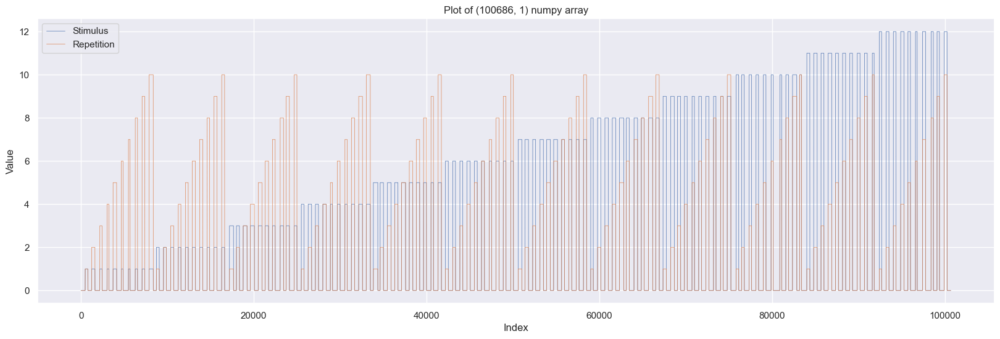

In [5]:
stimulus_print = stimulus.flatten()
repetition_print = repetition.flatten()
x = np.arange(len(stimulus_print))

plt.figure(figsize=(20, 6))
plt.plot(x, stimulus_print, label="Stimulus", linewidth=0.5)
plt.plot(x, repetition_print, label="Repetition", linewidth=0.5)
plt.title("Plot of (100686, 1) numpy array")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.show()

#### Original Full Signal

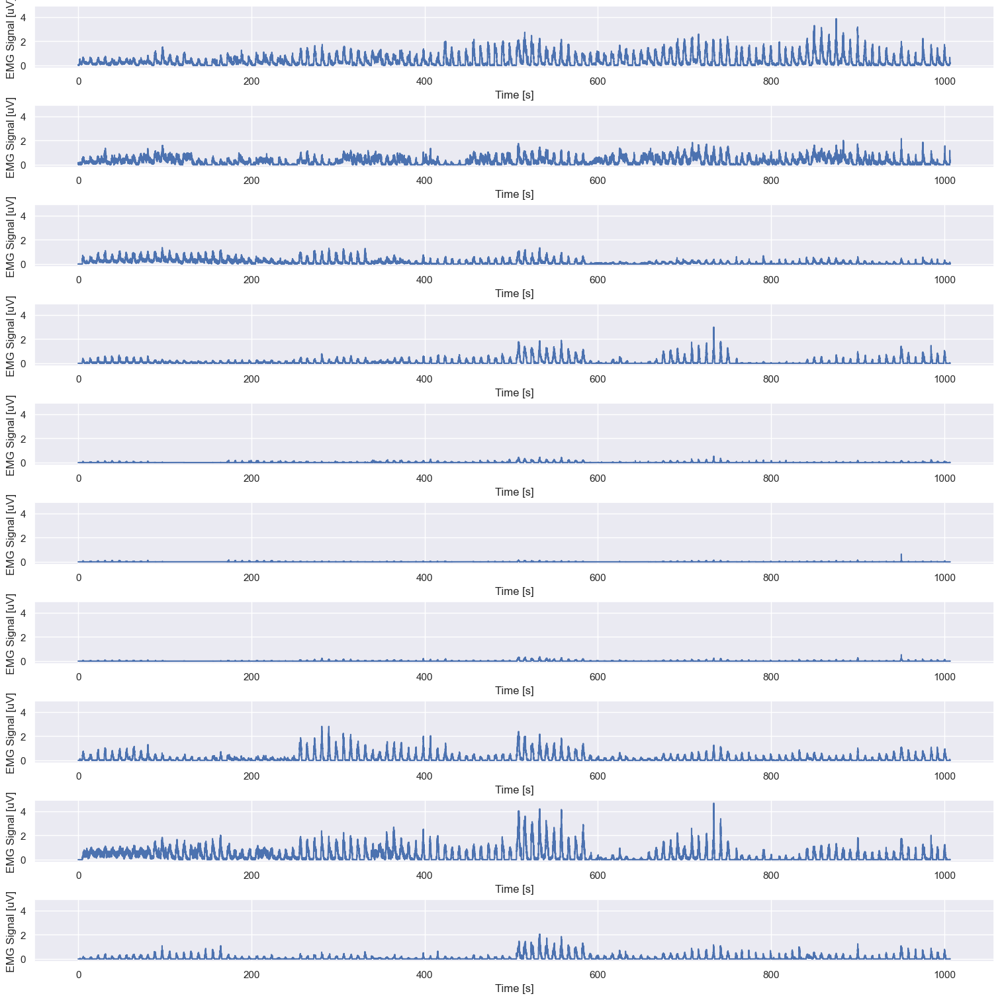

In [6]:
n_channels = emg.shape[1]

fs = 100 #Sampling frequency of the EMG signal

time_steps = np.arange(0,emg.shape[0]/fs, 1/fs) #Time vector for plotting

fig, ax = plt.subplots(n_channels, 1, constrained_layout=True, figsize=(15, 15), sharey=True)
for channel_idx in range(n_channels):
    ax[channel_idx].plot(time_steps, emg[:, channel_idx])
    ax[channel_idx].set_xlabel("Time [s]")
    ax[channel_idx].set_ylabel("EMG Signal [uV]")

#### Enveloped Full Signal

In [7]:
mov_mean_size = 25  #fs*0.25 as written in the reference paper
mov_mean_weights = np.ones(mov_mean_size) / mov_mean_size #The weights for the moving average. It's an array of equal weights summing to 1.

Text(0.5, 0.98, 'EMG envelopes')

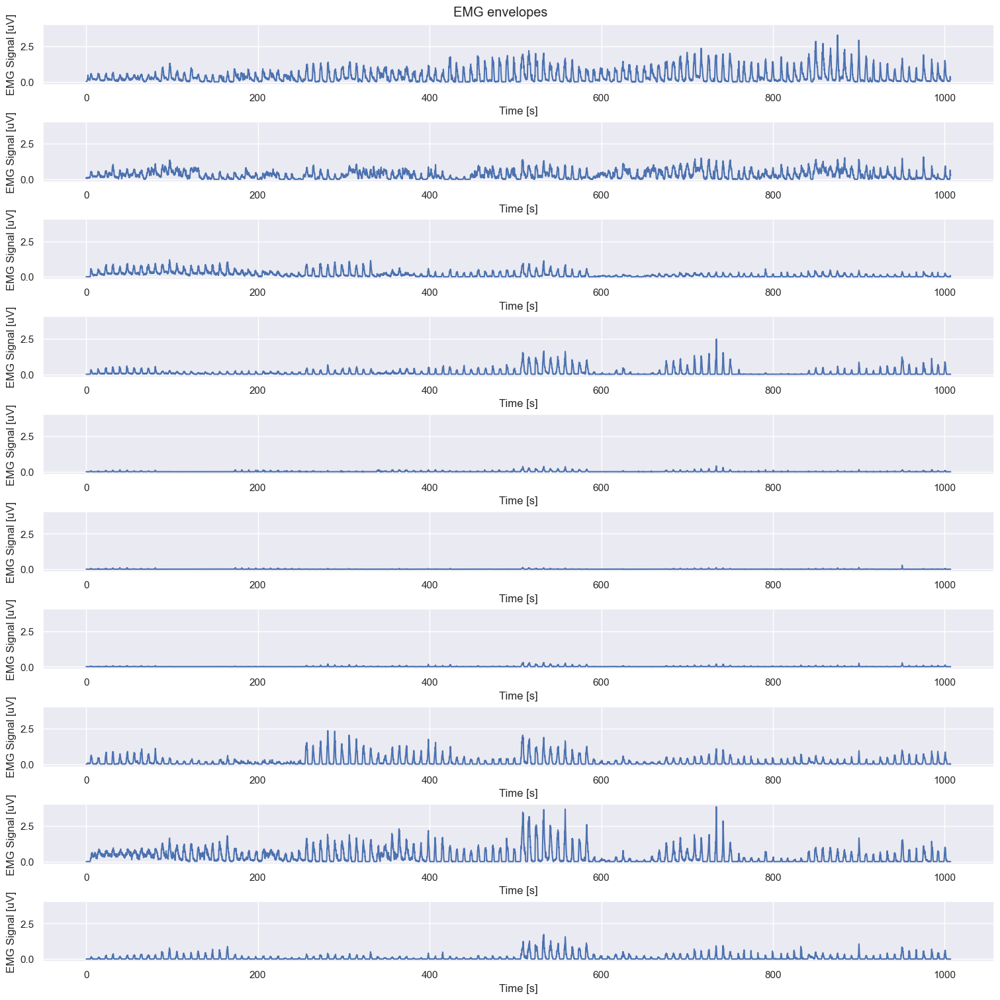

In [8]:
emg_envelopes_full = convolve1d(emg_rectified, weights=mov_mean_weights, axis=0) # convolve1d the rectified signal with the moving average weights

fig, ax = plt.subplots(n_channels, 1, constrained_layout=True, figsize=(15, 15), sharey=True)
for channel_idx in range(n_channels):
    ax[channel_idx].plot(time_steps, emg_envelopes_full[:, channel_idx])
    ax[channel_idx].set_xlabel("Time [s]")
    ax[channel_idx].set_ylabel("EMG Signal [uV]")
plt.suptitle("EMG envelopes")

#### Windows and Envelopes

In [9]:
#initializing the data structure
emg_windows = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)] #A 2D list of shape (n_stimuli, n_repetitions) to store the raw EMG data for each stimulus-repetition pair.
emg_envelopes = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]# A 2D list of shape (n_stimuli, n_repetitions) to store the smoothed EMG envelopes (rectified and averaged signals) for each stimulus-repetition pair.

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        idx = np.logical_and(stimulus == stimuli_idx + 1, repetition == repetition_idx + 1).flatten()
        emg_windows[stimuli_idx][repetition_idx] = emg_rectified[idx, :]
        emg_envelopes[stimuli_idx][repetition_idx] = convolve1d(emg_windows[stimuli_idx][repetition_idx], mov_mean_weights, axis=0)   # convolve1d the rectified signal in the window with the moving average weights   
        

#### Plot the windows and relative envelopes for stimulus 1 rep 1, autonomously and with shared y

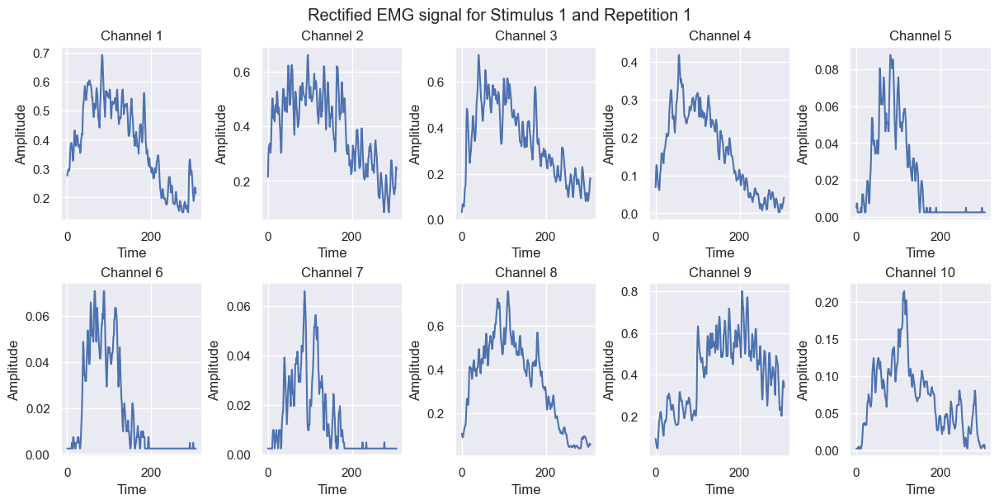

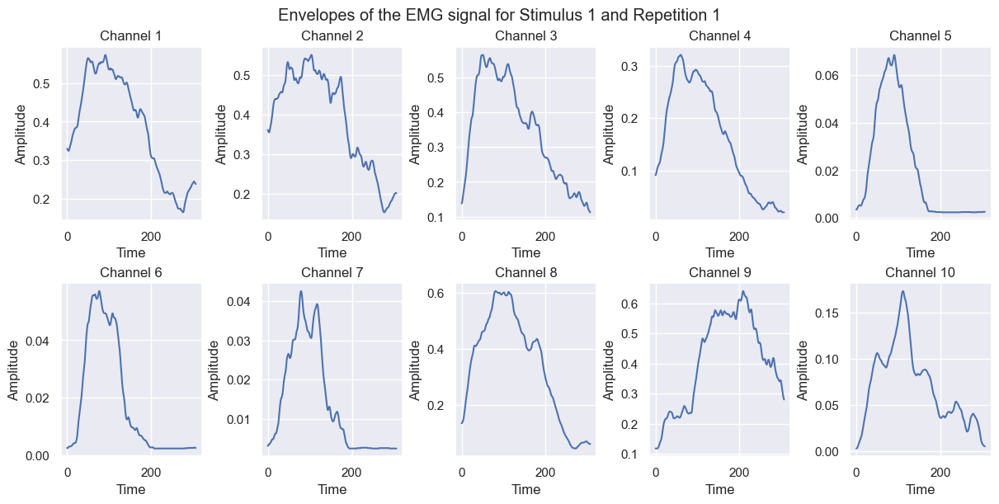

In [10]:
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
ax = ax.ravel()

stimulus_id = 0
repetition_id = 0

# Plot Rectified EMG signal for a specific trial (stimuli index 2, repetition index 0)
for channel_idx in range(n_channels): 
    ax[channel_idx].plot(emg_windows[stimulus_id][repetition_id][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
    ax[channel_idx].set_xlabel("Time")
    ax[channel_idx].set_ylabel("Amplitude")
plt.suptitle(f"Rectified EMG signal for Stimulus {stimulus_id+1} and Repetition {repetition_id+1}") 
plt.show()

# Initialize subplots for smoothed EMG envelopes
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
ax = ax.ravel()

# Plot Envelope of EMG signal for the same trial
for channel_idx in range(n_channels): 
    ax[channel_idx].plot(emg_envelopes[stimulus_id][repetition_id][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
    ax[channel_idx].set_xlabel("Time")
    ax[channel_idx].set_ylabel("Amplitude")
plt.suptitle(f"Envelopes of the EMG signal for Stimulus {stimulus_id+1} and Repetition {repetition_id+1}")  
plt.show()

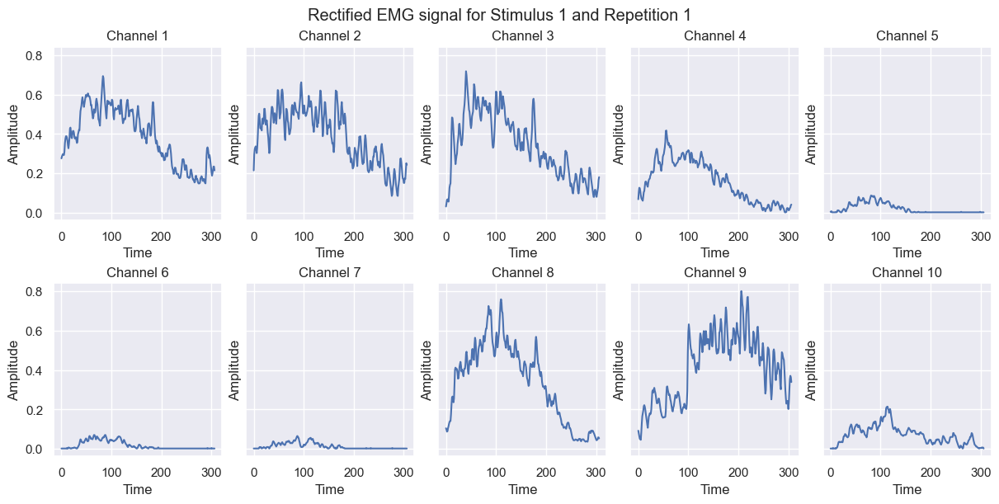

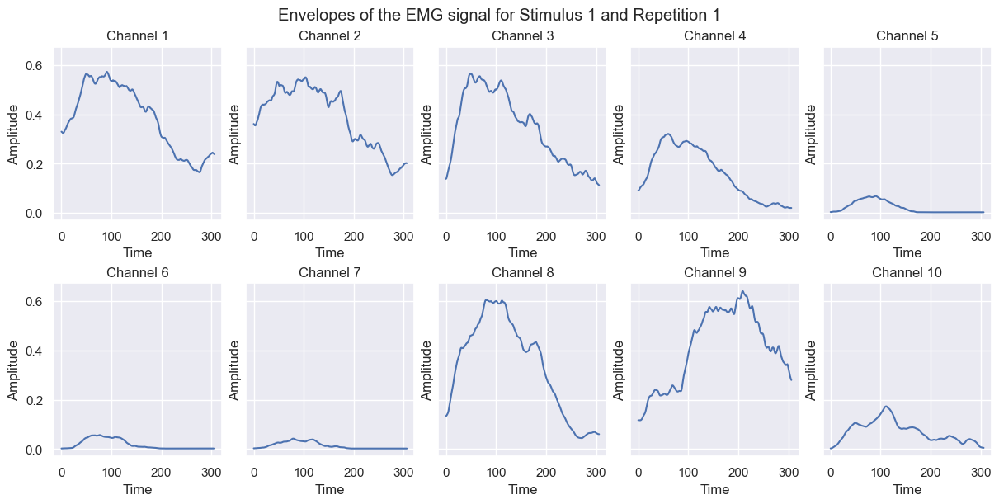

In [11]:
# Initialize subplots for rectified EMG signals
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharey=True)
ax = ax.ravel()

stimulus_id = 0
repetition_id = 0

# Plot Rectified EMG signal for a specific trial (stimuli index 2, repetition index 0)
for channel_idx in range(n_channels): 
    ax[channel_idx].plot(emg_windows[stimulus_id][repetition_id][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
    ax[channel_idx].set_xlabel("Time")
    ax[channel_idx].set_ylabel("Amplitude")
plt.suptitle(f"Rectified EMG signal for Stimulus {stimulus_id+1} and Repetition {repetition_id+1}") 
plt.show()

# Initialize subplots for smoothed EMG envelopes
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharey=True)
ax = ax.ravel()

# Plot Envelope of EMG signal for the same trial
for channel_idx in range(n_channels): 
    ax[channel_idx].plot(emg_envelopes[stimulus_id][repetition_id][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
    ax[channel_idx].set_xlabel("Time")
    ax[channel_idx].set_ylabel("Amplitude")
plt.suptitle(f"Envelopes of the EMG signal for Stimulus {stimulus_id+1} and Repetition {repetition_id+1}")  
plt.show()

#### Plot all the stimuli, repetitions and channels. Autonomously before and with shared y after

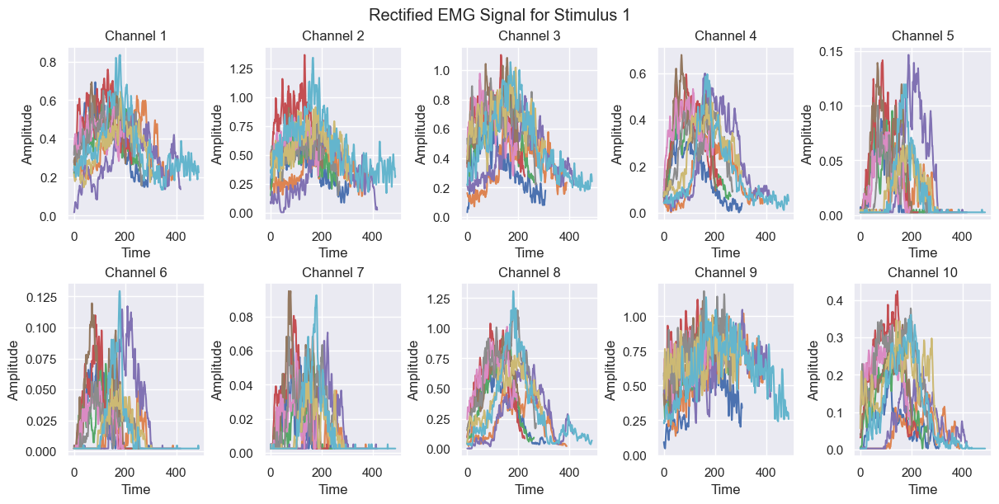

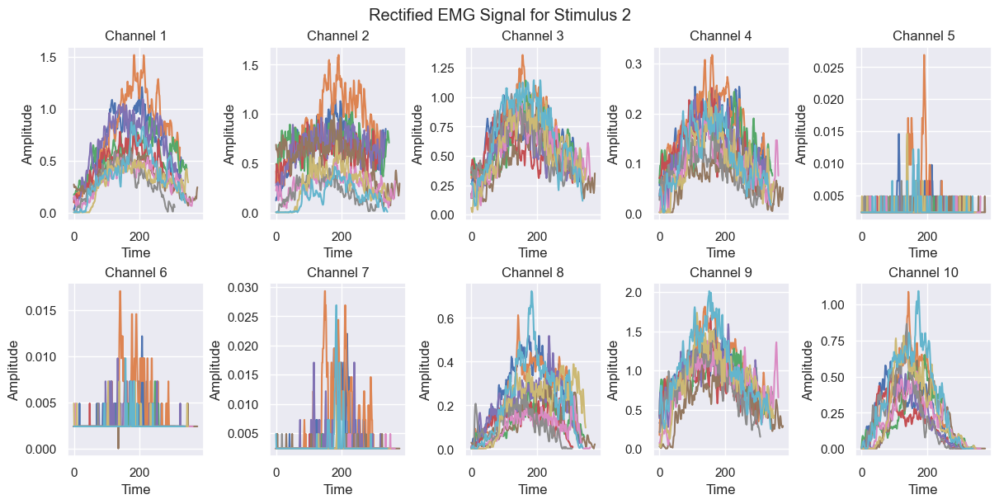

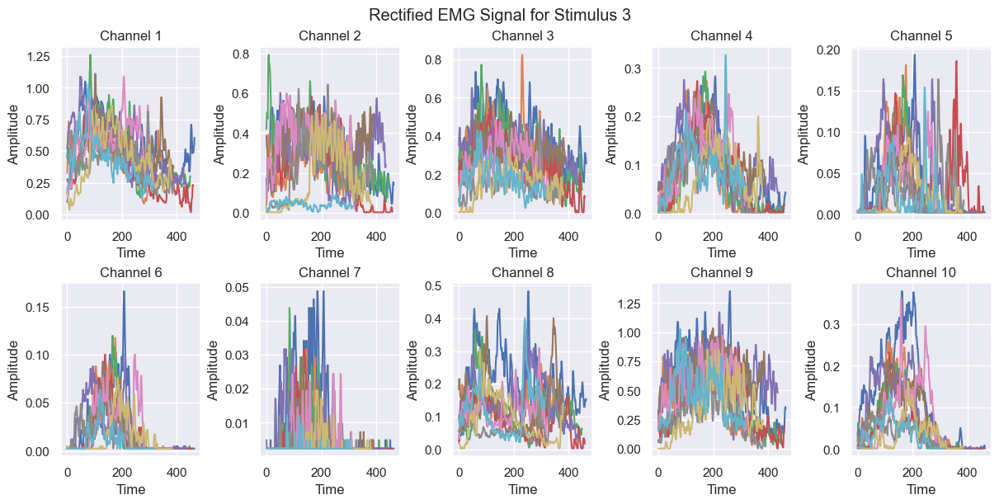

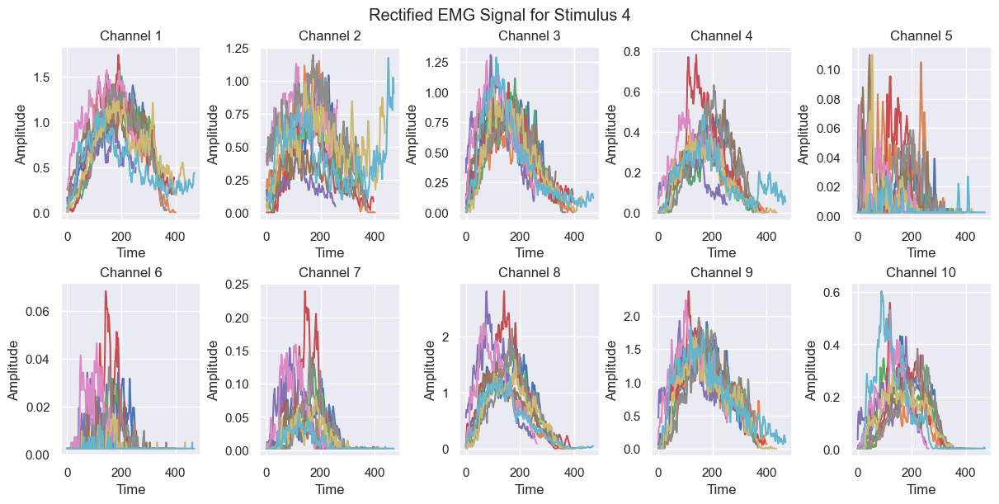

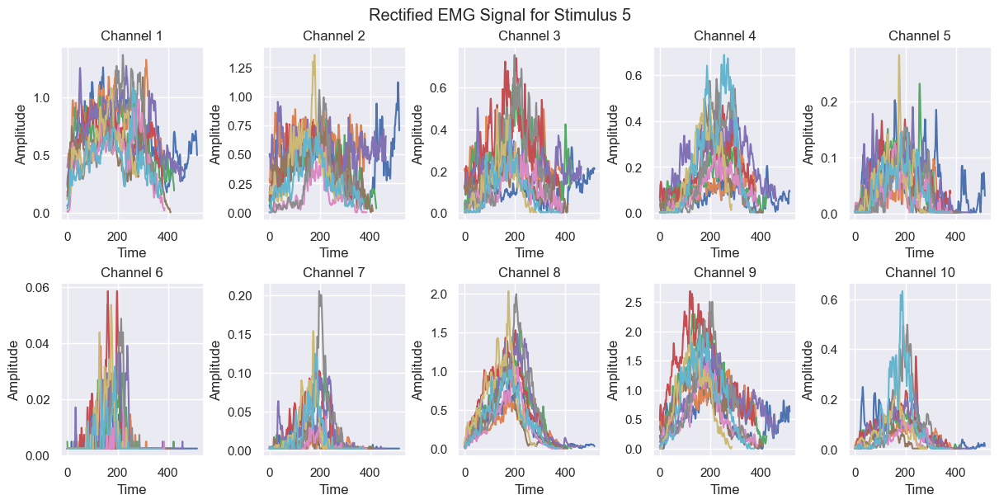

...

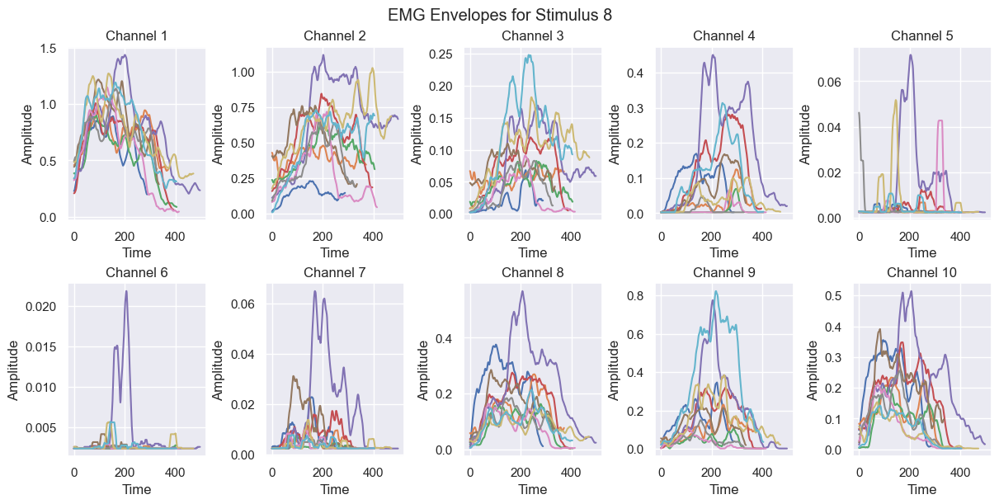

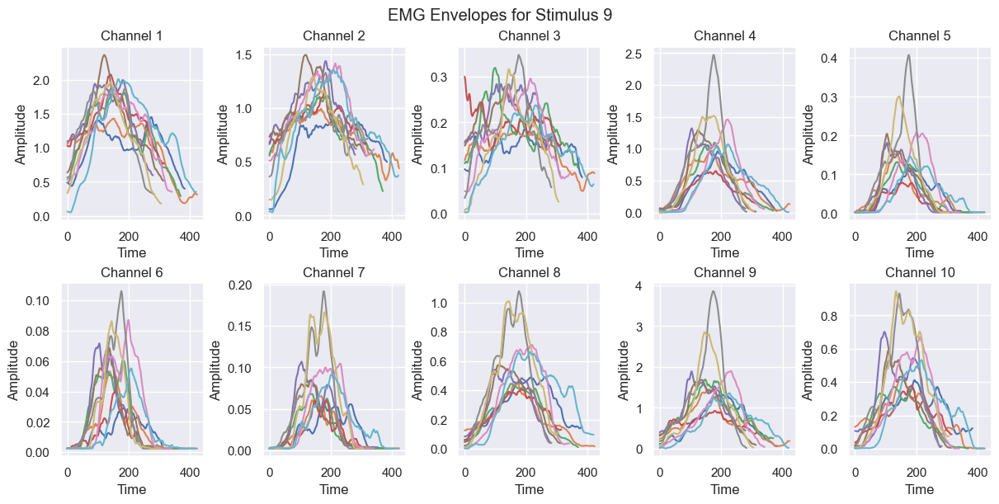

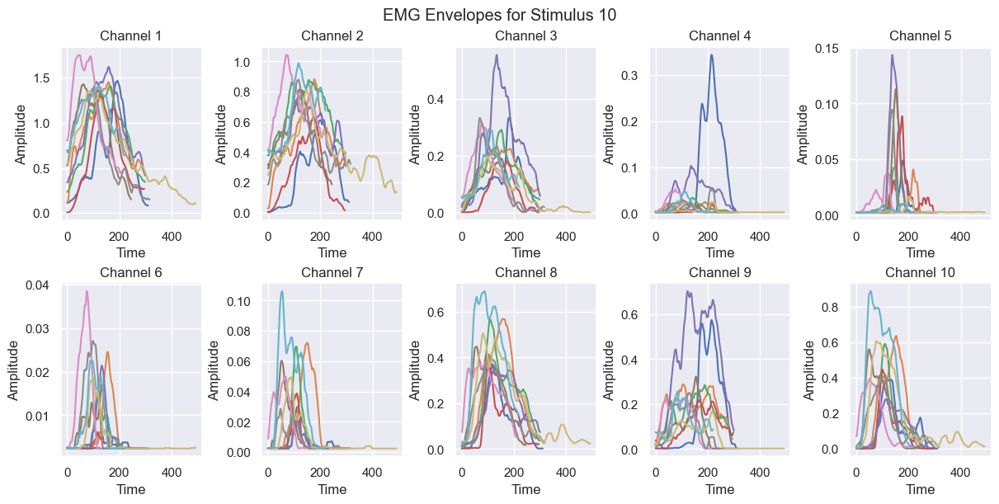

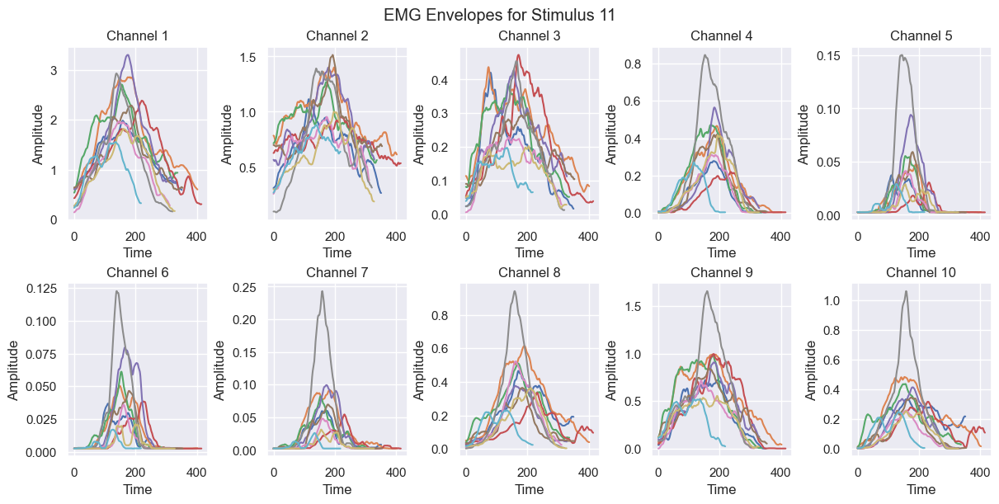

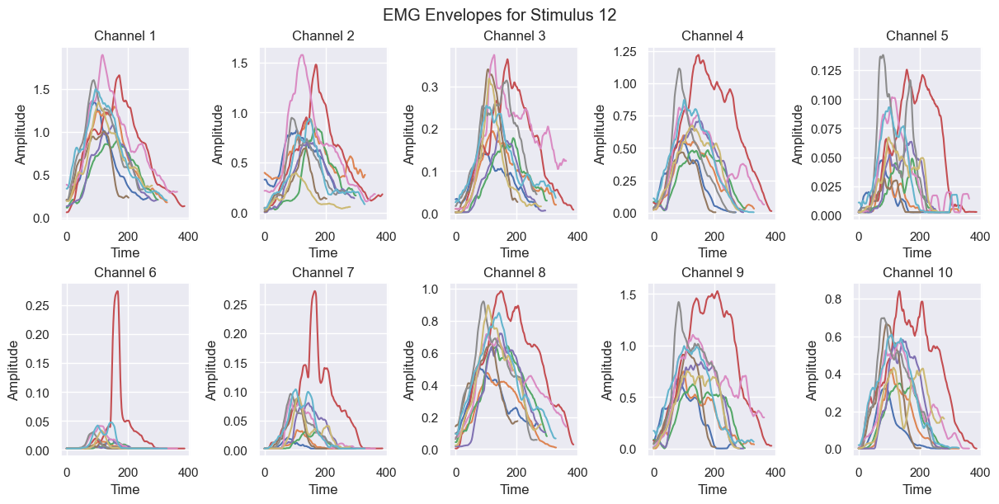

In [12]:
# Loop over all stimuli for rectified EMG signals
for stimulus_id in range(n_stimuli):
    # Initialize subplots for rectified EMG signals
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
    ax = ax.ravel()

    # Plot all repetitions for the current stimulus
    for channel_idx in range(n_channels):
        for repetition_id in range(n_repetitions):
            ax[channel_idx].plot(
                emg_windows[stimulus_id][repetition_id][:, channel_idx], 
                label=f"Repetition {repetition_id+1}"
            )
        ax[channel_idx].set_title(f"Channel {channel_idx+1}")
        ax[channel_idx].set_xlabel("Time")
        ax[channel_idx].set_ylabel("Amplitude")
    plt.suptitle(f"Rectified EMG Signal for Stimulus {stimulus_id+1}")
    plt.show()

# Loop over all stimuli for smoothed EMG envelopes
for stimulus_id in range(n_stimuli):
    # Initialize subplots for smoothed EMG envelopes
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
    ax = ax.ravel()

    # Plot all repetitions for the current stimulus
    for channel_idx in range(n_channels):
        for repetition_id in range(n_repetitions):
            ax[channel_idx].plot(
                emg_envelopes[stimulus_id][repetition_id][:, channel_idx], 
                label=f"Repetition {repetition_id+1}"
            )
        ax[channel_idx].set_title(f"Channel {channel_idx+1}")
        ax[channel_idx].set_xlabel("Time")
        ax[channel_idx].set_ylabel("Amplitude")
    plt.suptitle(f"EMG Envelopes for Stimulus {stimulus_id+1}")
    plt.show()

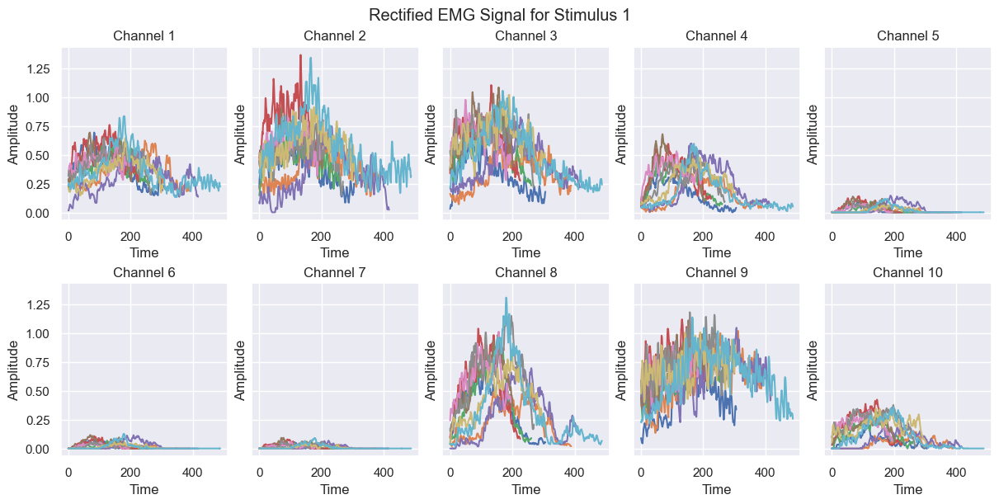

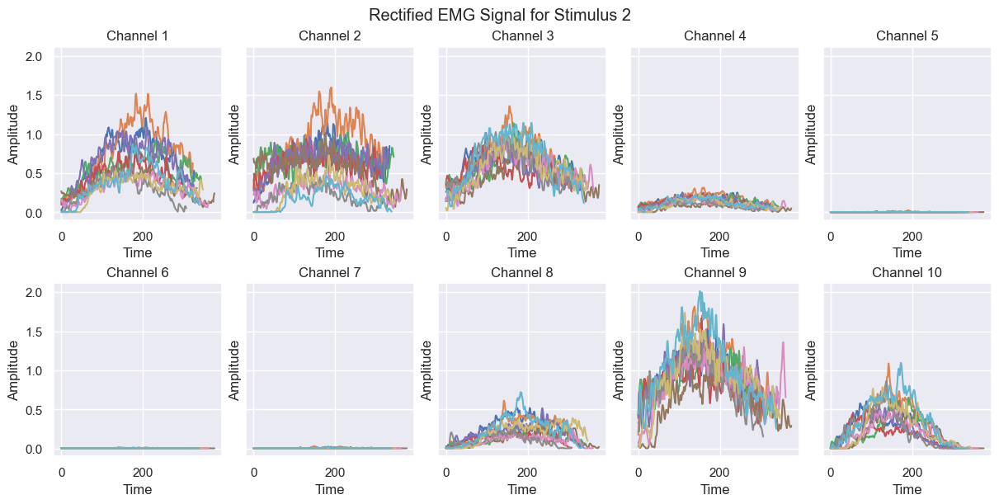

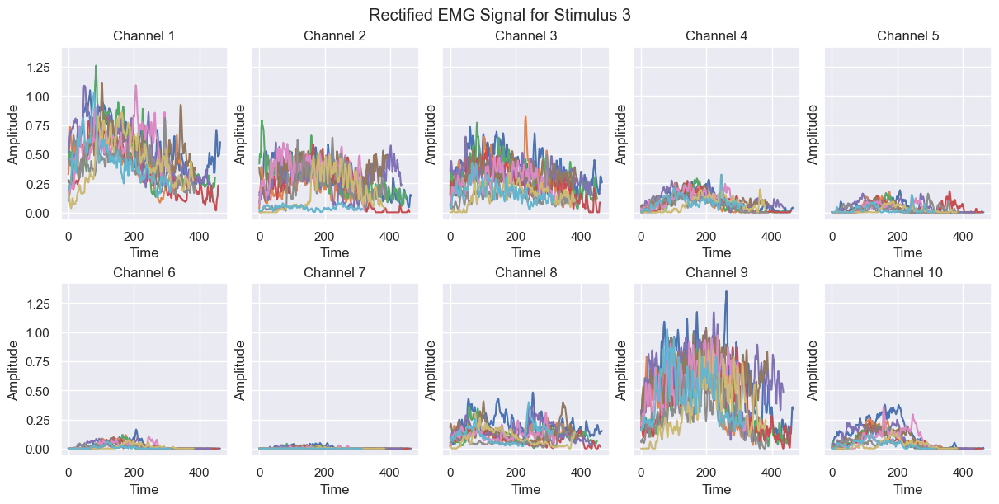

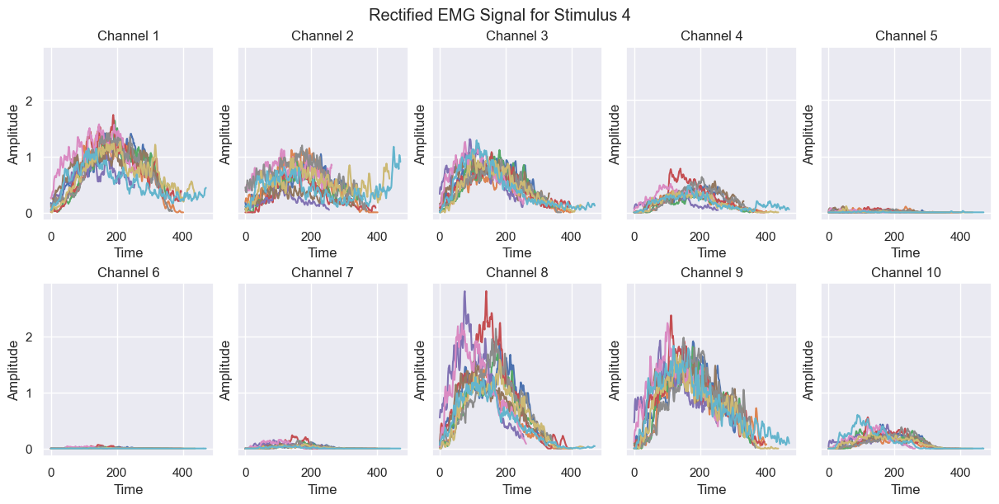

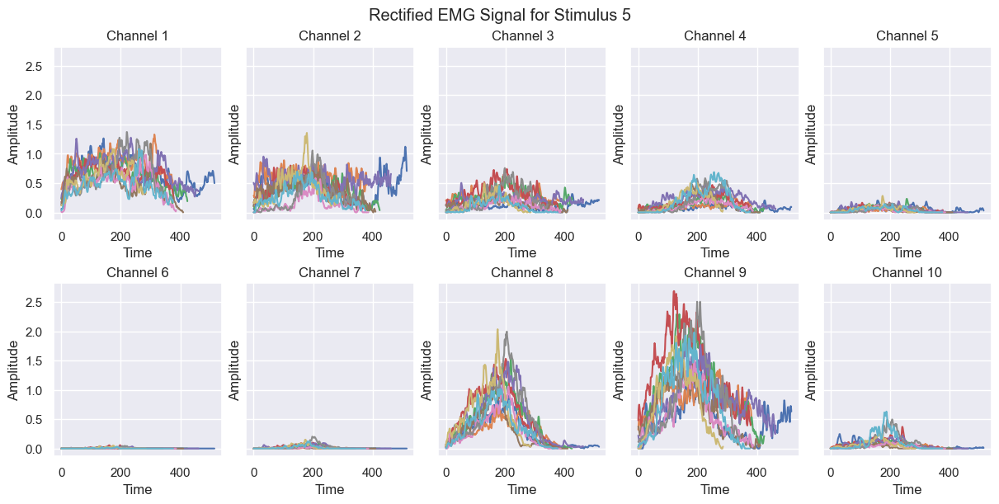

...

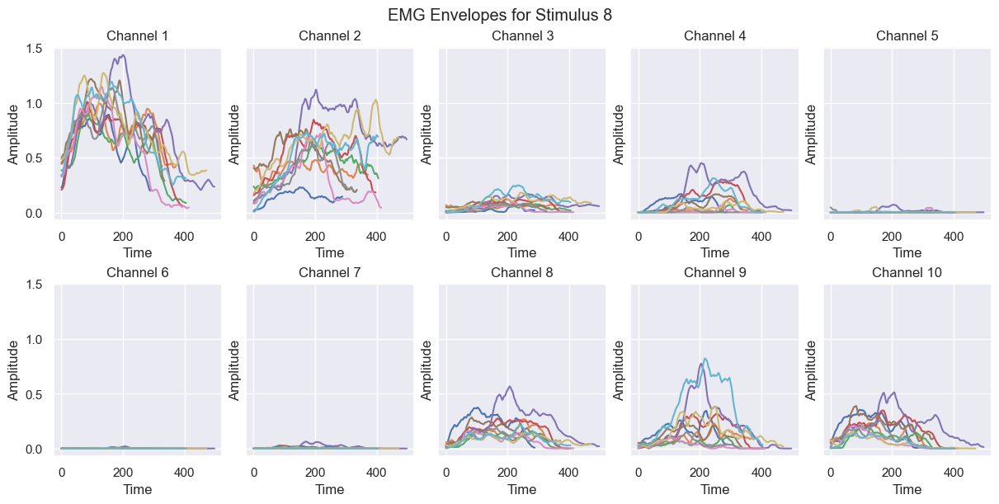

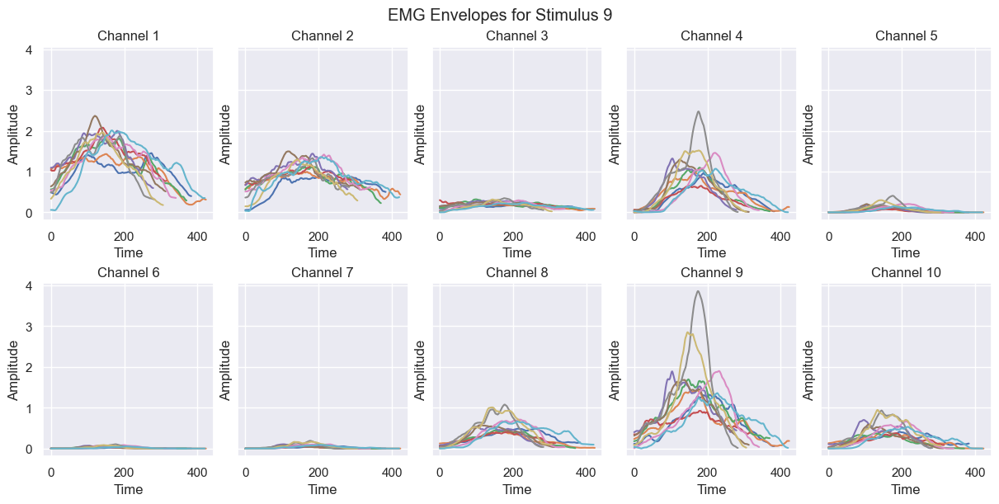

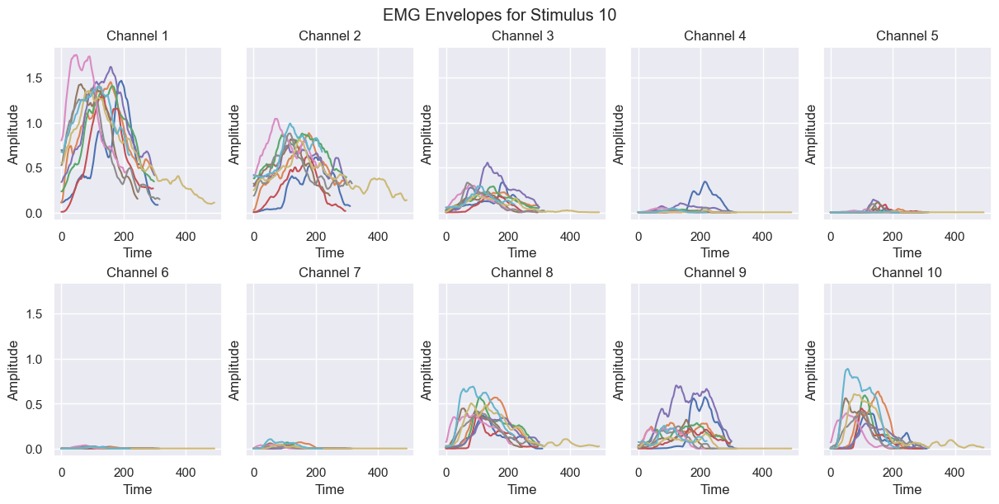

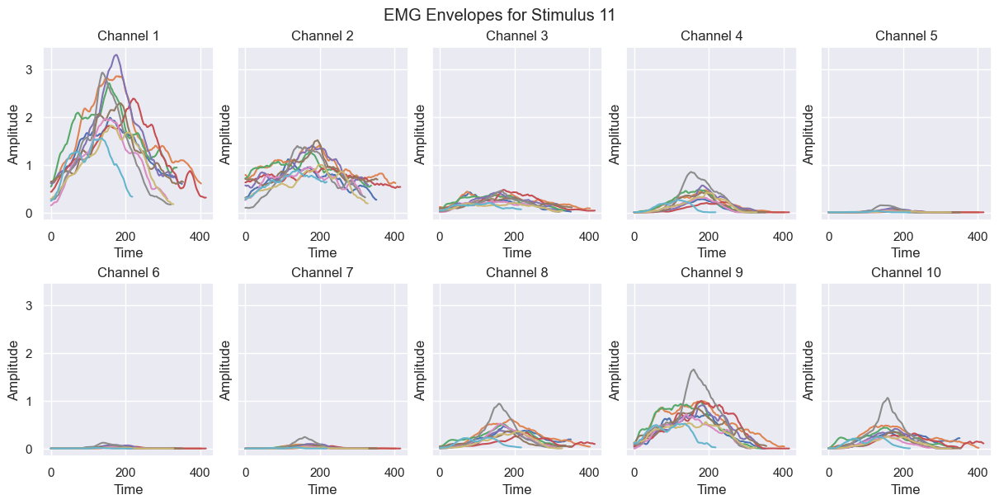

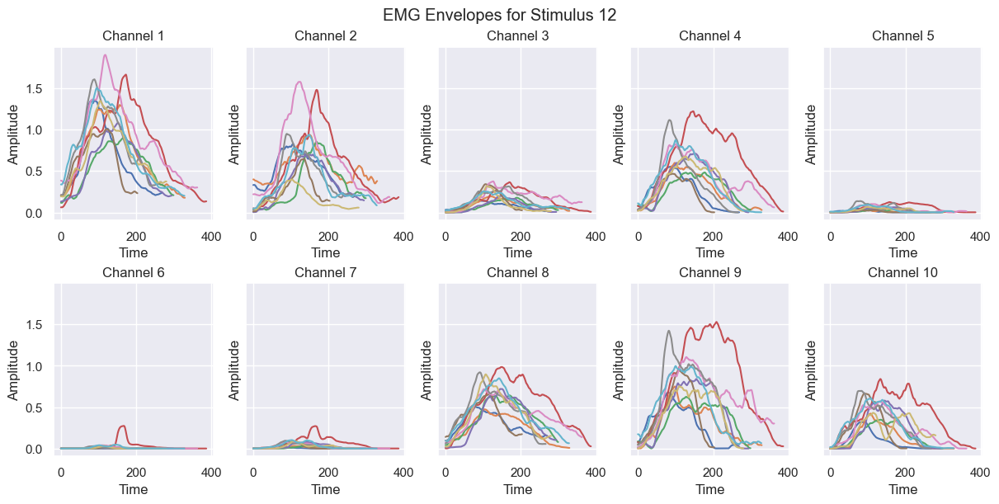

In [13]:
# Loop over all stimuli for rectified EMG signals
for stimulus_id in range(n_stimuli):
    # Initialize subplots for rectified EMG signals
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharey=True)
    ax = ax.ravel()

    # Plot all repetitions for the current stimulus
    for channel_idx in range(n_channels):
        for repetition_id in range(n_repetitions):
            ax[channel_idx].plot(
                emg_windows[stimulus_id][repetition_id][:, channel_idx], 
                label=f"Repetition {repetition_id+1}"
            )
        ax[channel_idx].set_title(f"Channel {channel_idx+1}")
        ax[channel_idx].set_xlabel("Time")
        ax[channel_idx].set_ylabel("Amplitude")
    plt.suptitle(f"Rectified EMG Signal for Stimulus {stimulus_id+1}")
    plt.show()

# Loop over all stimuli for smoothed EMG envelopes
for stimulus_id in range(n_stimuli):
    # Initialize subplots for smoothed EMG envelopes
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharey=True)
    ax = ax.ravel()

    # Plot all repetitions for the current stimulus
    for channel_idx in range(n_channels):
        for repetition_id in range(n_repetitions):
            ax[channel_idx].plot(
                emg_envelopes[stimulus_id][repetition_id][:, channel_idx], 
                label=f"Repetition {repetition_id+1}"
            )
        ax[channel_idx].set_title(f"Channel {channel_idx+1}")
        ax[channel_idx].set_xlabel("Time")
        ax[channel_idx].set_ylabel("Amplitude")
    plt.suptitle(f"EMG Envelopes for Stimulus {stimulus_id+1}")
    plt.show()


#### Average activation

In [14]:
# This operation calculates the mean activation for each channel over the time points for a specific stimulus and repetition.

emg_average_activations = np.zeros((n_channels, n_stimuli, n_repetitions)) #store the average activation values for each channel, stimulus, and repetition.
for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        #mean across time for each channel
        emg_average_activations[:, stimuli_idx, repetition_idx] = np.mean(emg_envelopes[stimuli_idx][repetition_idx], axis=0) 

#### Check for bad channels and trials -> check for constant signals over all the trials

In [15]:
def check_for_constant_channels(emg):
    indices = [index + 1 for index, value in enumerate(emg) if np.all(value == emg[0])]
    return indices

# Iterate through stimuli and repetitions
for stimuli_idx in range(n_stimuli):
    for rep_idx in range(n_repetitions):
        # Extract the channel activations for the current stimulus and repetition
        data_cropped = emg_average_activations[:, stimuli_idx, rep_idx]  # Shape: (n_channels,)
        # Check for constant channels
        indices = check_for_constant_channels(data_cropped)
        
        # If constant channels are found, print the details
        if len(indices) > 1:
            print(f"Stimulus: {stimuli_idx + 1}, Repetition: {rep_idx + 1}")
            print(f"Constant channels: {indices}")


#### No bad channels found

#### Check the average activation

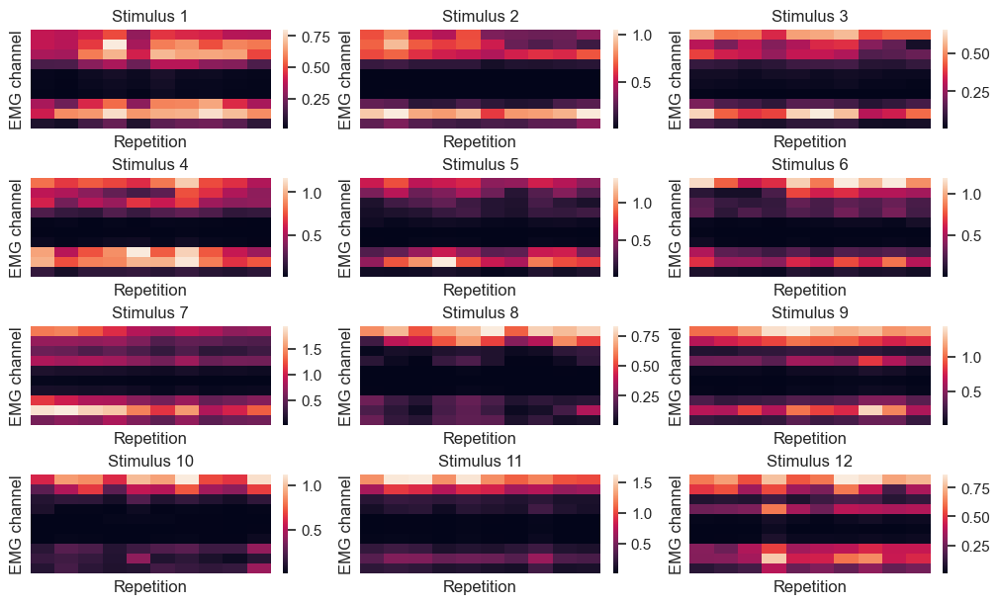

In [16]:
fig, ax = plt.subplots(4, 3, figsize=(10, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

for stimuli_idx in range(n_stimuli):
    sns.heatmap(np.squeeze(emg_average_activations[:, stimuli_idx, :]), ax=ax[stimuli_idx] ,xticklabels=False, yticklabels=False, cbar = True)
    ax[stimuli_idx].title.set_text("Stimulus " + str(stimuli_idx + 1))
    ax[stimuli_idx].set_xlabel("Repetition")
    ax[stimuli_idx].set_ylabel("EMG channel")

The rows represent the activity recorded by each channel in response to repeated stimuli. There appears to be a notable homogeneity across the rows, which aligns with expectations. Since each channel is exposed to the same stimulus, it's logical that they would capture similar muscular activities. This consistency suggests that the channels are functioning correctly and are reliably capturing the stimulus-induced activity. Anyway, there are some outliers (difference in color) but not strong enough to remove the channel. As a confirmation of the observations did above, channels 5 6 and 7 have an 0 average activation.

The columns correspond to each repetition of the stimulus. Variability across columns is expected due to several factors. Firstly, not all muscles are equally activated with each stimulus repetition, leading to differences in the recorded activity. Additionally, the impedance of each channel may vary, affecting the amplitude of the recorded signals. Therefore, the amplitude alone may not be a reliable metric for comparing channel responses. 

One approach to understand better what happens could be to normalize the signals, making them more comparable across channels. This normalization would help in identifying specific patterns of muscle activation unique to each stimulus, providing deeper insights into the neuromuscular responses elicited by different stimuli.

#### Average activation with data normalization

In [17]:
# Initialize an array to store the normalized activation values
emg_normalized_activations = np.zeros_like(emg_average_activations)

# Normalize across channels
for channel_idx in range(n_channels):
    # Compute mean and standard deviation for the current channel across all stimuli and repetitions
    channel_mean = np.mean(emg_average_activations[channel_idx])
    channel_std = np.std(emg_average_activations[channel_idx])

    # Avoid division by zero
    if channel_std != 0:
        emg_normalized_activations[channel_idx] = (emg_average_activations[channel_idx] - channel_mean) / channel_std
    else:
        emg_normalized_activations[channel_idx] = emg_average_activations[channel_idx]  # No normalization if std is zero


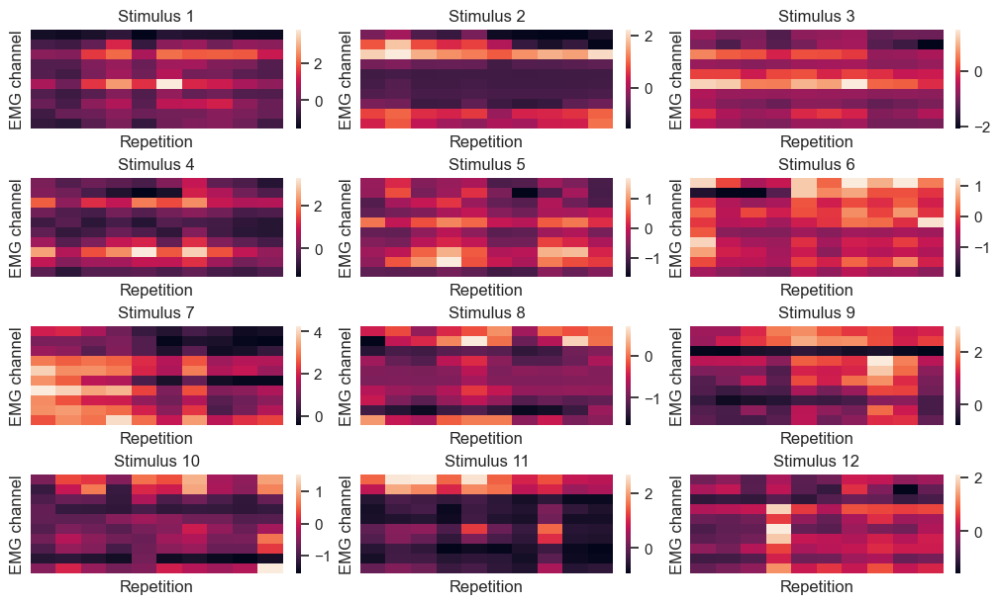

In [18]:
fig, ax = plt.subplots(4, 3, figsize=(10, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

for stimuli_idx in range(n_stimuli):
    sns.heatmap(np.squeeze(emg_normalized_activations[:, stimuli_idx, :]), ax=ax[stimuli_idx] ,xticklabels=False, yticklabels=False, cbar = True)
    ax[stimuli_idx].title.set_text("Stimulus " + str(stimuli_idx + 1))
    ax[stimuli_idx].set_xlabel("Repetition")
    ax[stimuli_idx].set_ylabel("EMG channel")

We can clearly see some differences and similarity looking at rows, sometimes channels are consistent across trial (stimulus 2), the ideal signal differs from rows but should be equal by columns (different repetitions of the same stimulus). We can also see some outliers (rep 4 of stimulus 12, repetition 8 of stimulus 11). But there are no consistent outliers, so, no trials or channels will be removed

#### ANOVA test

In [19]:
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd

# Assuming emg_normalized_activations is the normalized array (channels x stimuli x repetitions)

# Prepare data
n_channels, n_stimuli, n_repetitions = emg_normalized_activations.shape
results = {}

for channel_idx in range(n_channels):
    # Gather data for this channel across all stimuli
    data = [emg_normalized_activations[channel_idx, stim_idx, :].flatten() for stim_idx in range(n_stimuli)]
    
    # Perform One-Way ANOVA
    anova_result = f_oneway(*data)
    results[f'Channel {channel_idx + 1}'] = {'ANOVA p-value': anova_result.pvalue}
    
    if anova_result.pvalue < 0.05:  # Significant difference found
        # Flatten data and create labels for Tukey HSD
        flattened_data = np.hstack(data)
        labels = np.array([[f'Stimulus {i + 1}'] * n_repetitions for i in range(n_stimuli)]).flatten()
        
        # Perform Tukey HSD
        tukey_result = pairwise_tukeyhsd(flattened_data, labels, alpha=0.05)
        results[f'Channel {channel_idx + 1}']['Tukey HSD'] = tukey_result.summary()

# Print results
for channel, res in results.items():
    print(f"Results for {channel}:")
    print(f"ANOVA p-value: {res['ANOVA p-value']}")
    if 'Tukey HSD' in res:
        print(res['Tukey HSD'])
    print("\n")


Results for Channel 1:
ANOVA p-value: 2.0095699023755547e-27
     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
   group1      group2   meandiff p-adj   lower   upper  reject
--------------------------------------------------------------
 Stimulus 1 Stimulus 10   1.3744    0.0  0.5836  2.1651   True
 Stimulus 1 Stimulus 11   2.8228    0.0   2.032  3.6136   True
 Stimulus 1 Stimulus 12   0.9292  0.008  0.1384  1.7199   True
 Stimulus 1  Stimulus 2   0.2197 0.9987 -0.5711  1.0105  False
 Stimulus 1  Stimulus 3   0.2354 0.9975 -0.5554  1.0262  False
 Stimulus 1  Stimulus 4   1.0756 0.0008  0.2848  1.8664   True
 Stimulus 1  Stimulus 5   0.6782 0.1687 -0.1126   1.469  False
 Stimulus 1  Stimulus 6   1.6956    0.0  0.9048  2.4864   True
 Stimulus 1  Stimulus 7   1.8907    0.0  1.0999  2.6815   True
 Stimulus 1  Stimulus 8   0.9293  0.008  0.1385    1.72   True
 Stimulus 1  Stimulus 9     2.55    0.0  1.7592  3.3408   True
Stimulus 10 Stimulus 11   1.4484    0.0  0.6577  2.2392  

the ANOVA test is too specific and data-driven so we decided to not use it

## 2. Split the data into training, validation, and testing sets for the subject.

We created two balanced datasets for both training and testing by maintaining the same percentage of repetitions for each stimulus across both sets. To achieve this, we randomly selected indices for the test set while ensuring that the number of repetitions per stimulus and the total number of stimuli remained consistent. This method helps in maintaining the balance across both datasets. The dataset was split using an 80-20 split, meaning 80% of the data was allocated to the training set, and 20% was allocated to the test set.

In [20]:
rep1 = np.random.randint(1, 10)

rep2 = np.random.randint(1, 10)
while rep2 == rep1:
    rep2 = np.random.randint(1, 10)
    
test_indices = [rep1, rep2]
train_indices = [i for i in range(1, 11) if i not in test_indices]

print("Test indices:", test_indices)
print("Train indices:", train_indices)

Test indices: [7, 4]
Train indices: [1, 2, 3, 5, 6, 8, 9, 10]


In [21]:
def build_dataset_from_ninapro(emg, stimulus, repetition, features=None, indices=None):
    # Calculate the number of unique stimuli and repetitions, subtracting 1 to exclude the resting condition
    n_stimuli = np.size(np.unique(stimulus)) - 1 # 12
    n_repetitions = len(indices) # 2 or 8
    n_samples = n_stimuli * n_repetitions #24 or 96
    
    # Number of channels in the EMG data
    n_channels = emg.shape[1] #10
    
    n_features = sum(n_channels for feature in features)
    
    dataset = np.zeros((n_samples, n_features)) # 24 or 96 rows, features.len * n_channels columns
    labels = np.zeros(n_samples) # 24 or 96 rows
    current_sample_index = 0
    
    # one label per sample, each sample is a repetition of a stimulus (trial) 
    
    # Loop over each stimulus and repetition to extract features
    for i in range(n_stimuli):
        for j in indices:
            # Assign the label for the current sample
            labels[current_sample_index] = i + 1
            # Calculate the current sample index based on stimulus and repetition
            current_feature_index = 0
            # Select the time steps corresponding to the current stimulus and repetition
            selected_tsteps = np.logical_and(stimulus == i + 1, repetition == j).squeeze()
            
            # Loop over each feature function provided
            for feature in features:
                # Determine the indices in the dataset where the current feature will be stored
                selected_features = np.arange(current_feature_index, current_feature_index + n_channels)
                # Apply the feature function to the selected EMG data and store the result
                dataset[current_sample_index, selected_features] = feature(emg[selected_tsteps, :])
                # Update the feature index for the next feature
                current_feature_index += n_channels

            # Move to the next sample
            current_sample_index += 1
            
     # Return the constructed dataset and corresponding labels
    return dataset, labels

## 3. Extract features from the trials (at least 5 different ones).
- Mean Absolute Value (MAV)
- Standard Deviation (STD)
- Maximum absolute Value (MaxAV)
- Root mean square (RMS)
- Waveform length (WL)
- Slope sign changes (SSC)
- Cepstral Coefficients (Ceps)

In [22]:
# Cepstral Coefficients (Ceps)
from scipy.fftpack import dct

def cepstral_coefficients(x, num_coeffs=1):
    """Compute Cepstral Coefficients using DCT of log-spectrum."""
    ceps = np.zeros((x.shape[1], num_coeffs))
    for ch in range(x.shape[1]):
        spectrum = np.abs(np.fft.fft(x[:, ch]))
        log_spectrum = np.log1p(spectrum[:len(spectrum)//2])
        ceps[ch, :] = dct(log_spectrum, type=2, norm='ortho')[:num_coeffs]
    return ceps

# Mean Absolute Value (MAV)
mav = lambda x: np.mean(np.abs(x), axis=0)
# Standard Deviation (STD)
std = lambda x: np.std(x, axis=0)
# Maximum absolute Value (MaxAV)
maxav = lambda x: np.max(np.abs(x), axis=0)
# Root mean square (RMS)
rms  = lambda x: np.sqrt(np.mean(x**2, axis=0))
# Waveform length (WL)
wl  = lambda x: np.sum(np.abs(np.diff(x, axis=0)), axis=0)
# Slope sign changes (SSC)
ssc = lambda x: np.sum(np.diff(np.sign(np.diff(x, axis=0)), axis=0) != 0, axis=0)
# Cepstral Coefficients (Ceps)
ceps = lambda x: cepstral_coefficients(x.reshape(-1, 1), num_coeffs=12).flatten()[0] # 12 coefficients, take the first one

In [23]:
X_train_set, y_train_set = build_dataset_from_ninapro(emg, stimulus, repetition, features=[mav, std, maxav, rms, wl, ssc, ceps], indices=train_indices)
X_test_set, y_test_set = build_dataset_from_ninapro(emg, stimulus, repetition, features=[mav, std, maxav, rms, wl, ssc, ceps], indices=test_indices)

In [24]:
print(X_train_set.shape)
print(y_train_set.shape)
print(X_test_set.shape)
print(y_test_set.shape)

(96, 70)
(96,)
(24, 70)
(24,)


In [25]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = X_train_set.copy()
y_train = y_train_set.copy()
X_test = X_test_set.copy()
y_test = y_test_set.copy()

# Normalizing the data
# StandardScaler is used to scale the features so that they have a mean of 0 and a standard deviation of 1
X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
X_test_z = scaler.transform(X_test)        # Transform the test data using the same scaler

#### Visualize mean and standard deviation of features across channels for each stimulus

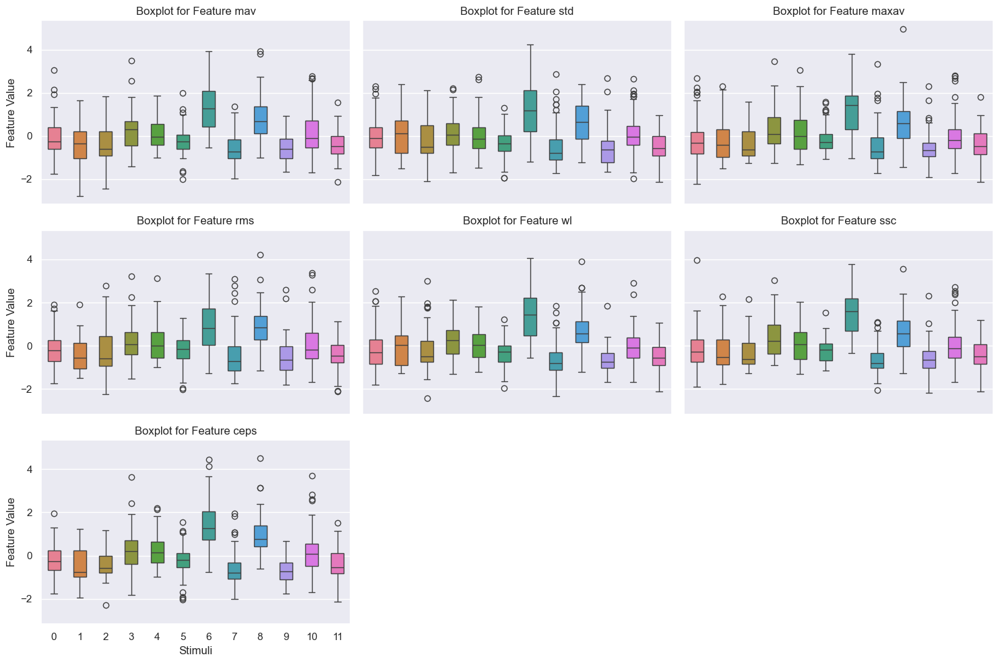

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assume dataset_train is the matrix (96x70)
n_repetitions = 8  # Number of repetitions per stimulus
n_stimuli = 12  # Total number of stimuli
n_channels = 10
n_features = 7
feature_names = ["mav", "std", "maxav", "rms", "wl", "ssc", "ceps"]

# Split data into chunks corresponding to each stimulus
stimulus_data = np.array_split(X_train_z, n_stimuli)

# Adjust grid layout for the number of features
fig, axes = plt.subplots(3, 3, figsize=(15, 10), sharex=True, sharey=True)

# Flatten axes for easier iteration (handling unused axes later)
axes = axes.flatten()

for feature_idx in range(n_features):
    data_for_feature = []

    for stimulus_idx in range(n_stimuli):
        # Reshape data for the current stimulus
        reshaped = stimulus_data[stimulus_idx].reshape(n_repetitions, n_channels, n_features)
        feature_values = reshaped[:, :, feature_idx]  # Shape: (8, 10)

        # Flatten the feature values for easy plotting
        flattened_values = feature_values.flatten()
        data_for_feature.append(flattened_values)

    # Create a boxplot for the current feature
    sns.boxplot(data=data_for_feature, ax=axes[feature_idx], orient="v", width=0.5)
    axes[feature_idx].set_title(f"Boxplot for Feature {feature_names[feature_idx]}")
    axes[feature_idx].set_xlabel("Stimuli")
    axes[feature_idx].set_ylabel("Feature Value")
    

# Hide unused subplots if there are any
for i in range(n_features, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()


From these plots we can see that Stimulus 7 has a higher answer to each feature, while the others are more or less similar. Variance is sometimes higher, sometimes lower.

To answer the question: "Are the values similar between repetitions?", we should look at the variance of each block, it varies between stimuli and features but is more or lest consistent

To answer the question: "Are the values similar between channels?" we should look at the next cell

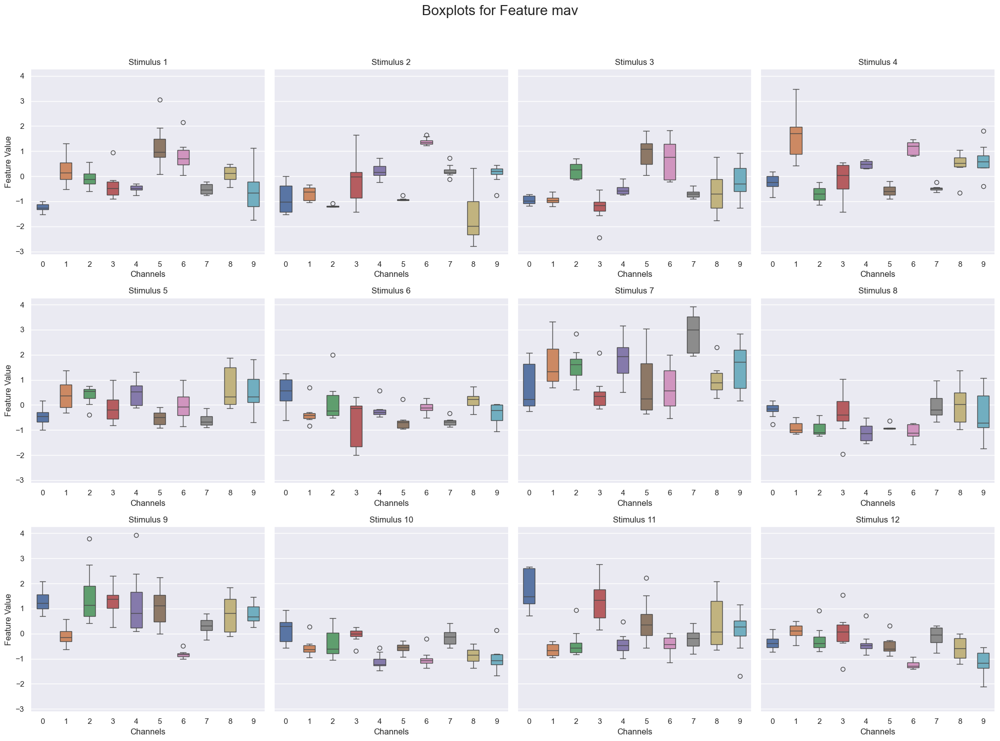

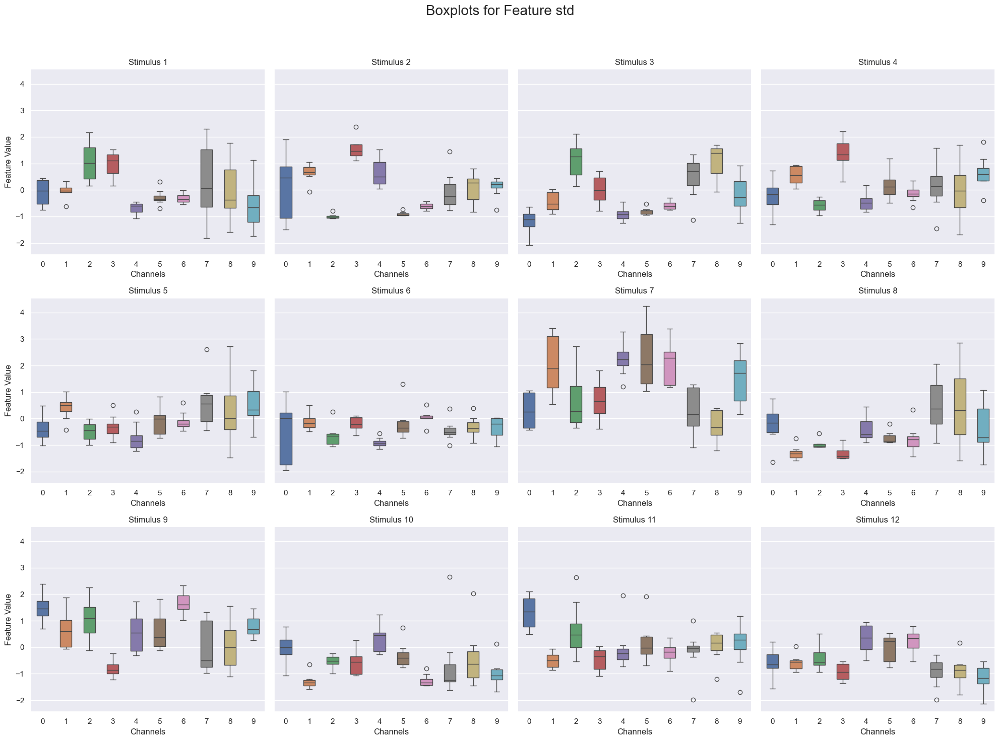

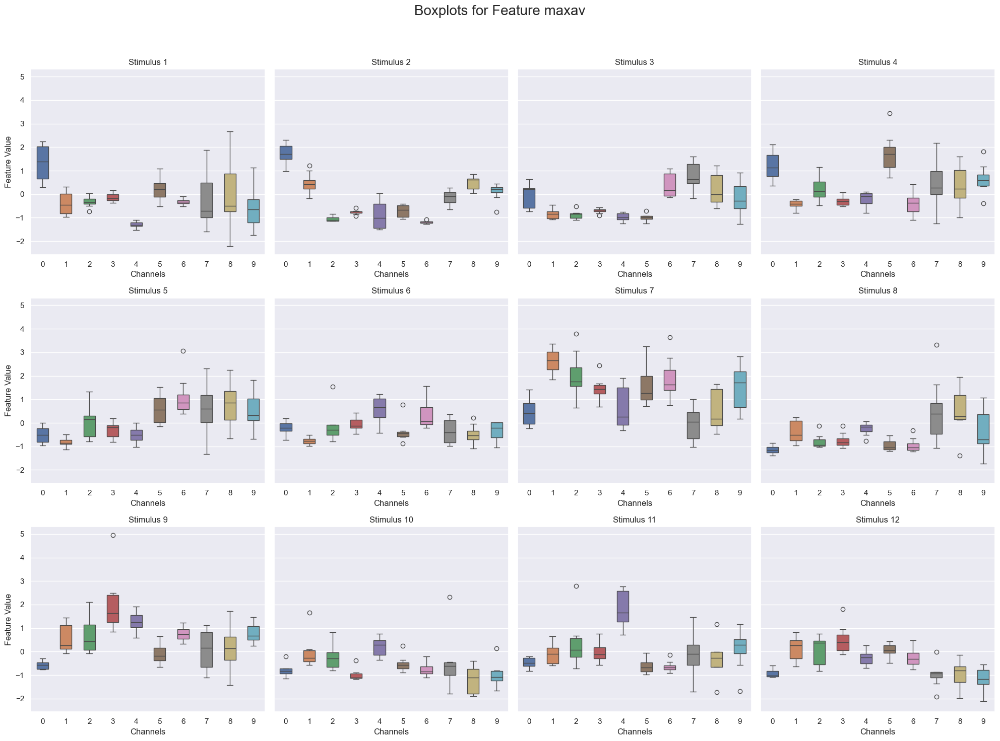

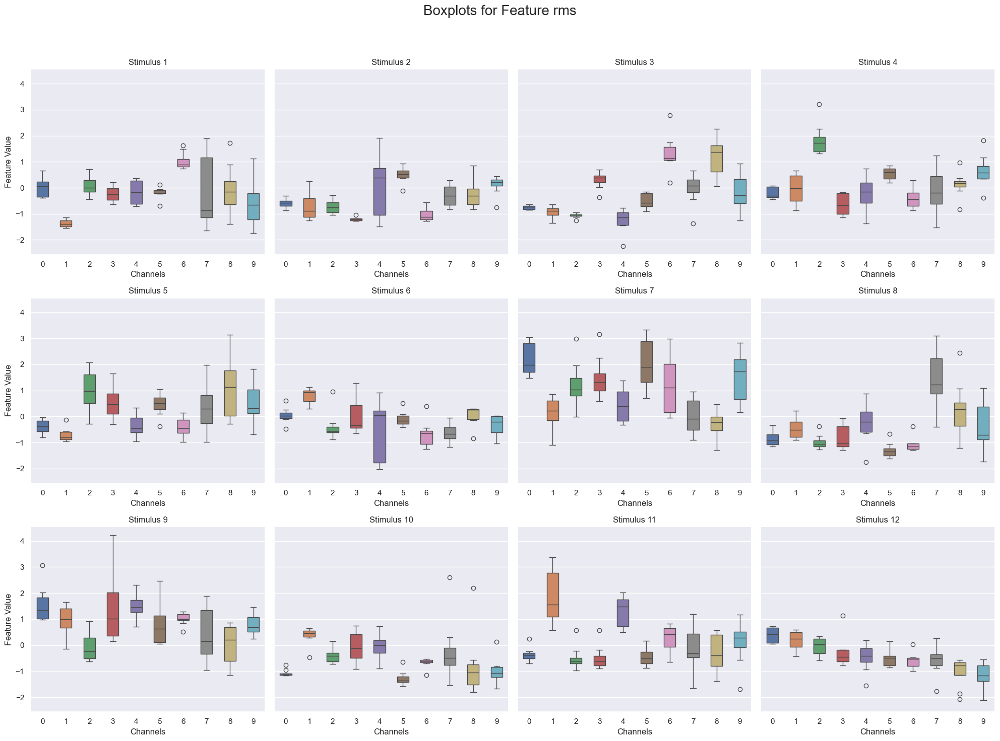

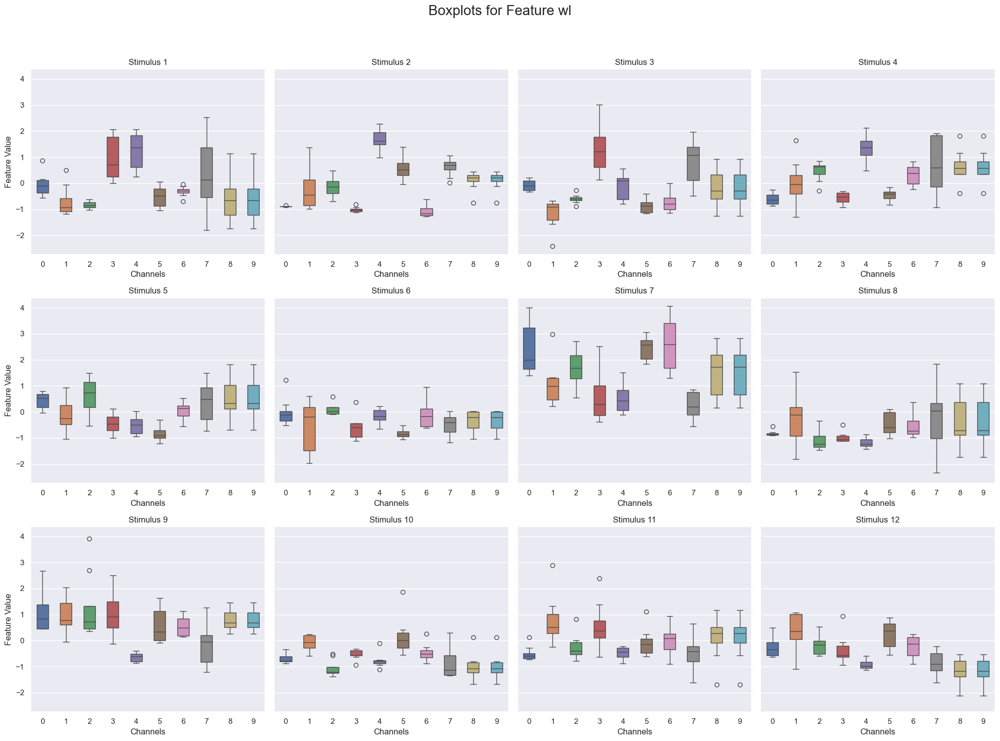

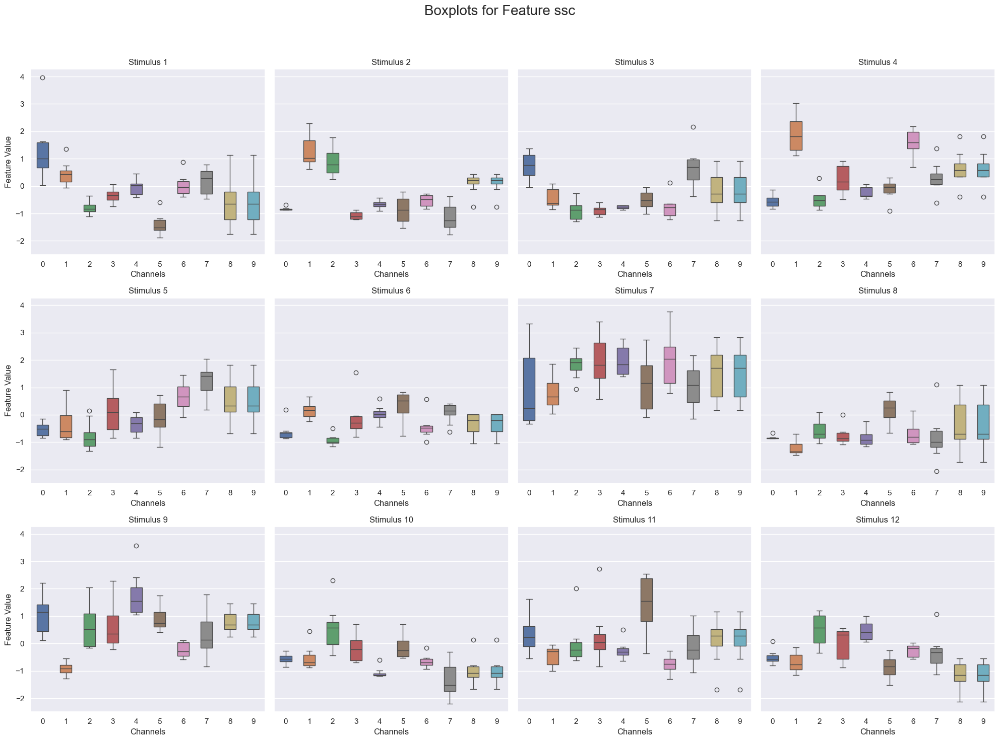

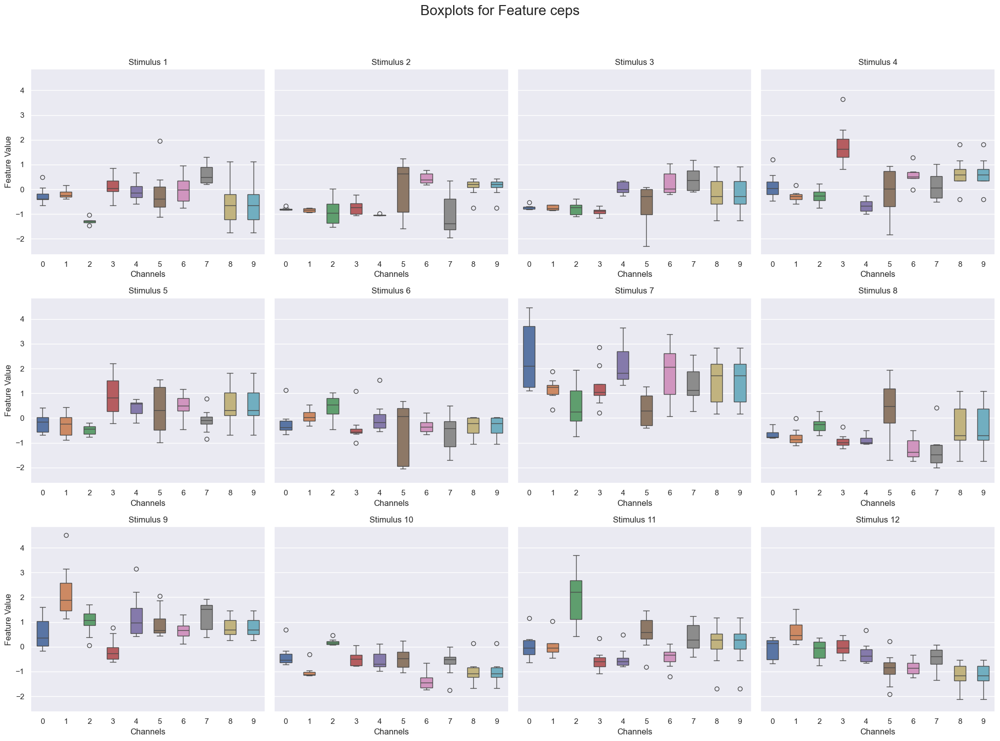

In [27]:
#TRAIN SET
n_repetitions = 8 # Number of repetitions per stimulus in the training set
n_stimuli = 12 # Total number of stimuli
n_channels = 10
n_features = 7
stimulus_data = np.array_split(X_train_z, n_stimuli)


feature_names=["mav", "std", "maxav", "rms", "wl", "ssc", "ceps"]


for feature_idx in range(n_features):
    # Prepare figure
    fig, axs = plt.subplots(3, 4, figsize=(20, 15), sharey=True)  # 3x4 grid for 12 stimuli
    fig.suptitle(f"Boxplots for Feature {feature_names[feature_idx]}", fontsize=20)

    # Iterate through each stimulus
    for stimulus_idx in range(n_stimuli):
        # Reshape data for the current stimulus
        reshaped = stimulus_data[stimulus_idx].reshape(n_repetitions, n_channels, n_features)  # Shape: (8, 10, 7)
        feature_values = reshaped[:, :, feature_idx]  # Shape: (8, 10)

        # Determine subplot position
        row, col = divmod(stimulus_idx, 4)
        ax = axs[row, col]

        # Create boxplot
        sns.boxplot(data=feature_values, ax=ax, orient="v", width=0.5)
        ax.set_title(f"Stimulus {stimulus_idx + 1}")
        ax.set_xlabel("Channels")
        ax.set_ylabel("Feature Value")

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the title
    plt.show()

Different channels have a notably different ean and variance for different features and stimuli. We are not able to make a precise answer on these plots, anyway we have not found clear outliers

Lets look at the numerical values

In [28]:
# emg_rectified has the shape (timepoints, n_channels)
n_timepoints, n_channels = emg_rectified.shape

# Parameters
timepoints_per_stimulus = n_timepoints // n_stimuli  # Number of timepoints per stimulus
timepoints_per_rep = timepoints_per_stimulus // n_repetitions  # Number of timepoints per repetition

# Initialize storage for features
features = {}

# Loop through each stimulus
for stim in range(n_stimuli):
    stim_start_idx = stim * timepoints_per_stimulus
    stim_end_idx = (stim + 1) * timepoints_per_stimulus
    stim_data = emg_rectified[stim_start_idx:stim_end_idx, :]  # Data for this stimulus

    # Initialize storage for this stimulus
    stim_features = {}

    # Loop through each repetition within the stimulus
    for rep in range(n_repetitions):
        rep_start_idx = rep * timepoints_per_rep
        rep_end_idx = (rep + 1) * timepoints_per_rep
        rep_data = stim_data[rep_start_idx:rep_end_idx, :]  # Data for this repetition

        # Initialize storage for this repetition
        rep_features = {}

        # Loop through each channel
        for i in range(n_channels):
            channel_data = rep_data[:, i]  # Data for this channel in the current repetition
            rep_features[f"Channel {i+1}"] = {
                "MAV": float(mav(channel_data)),
                "STD": float(std(channel_data)),
                "MaxAV": float(maxav(channel_data)),
                "RMS": float(rms(channel_data)),
                "WL": float(wl(channel_data)),
                "SSC": float(ssc(channel_data)),
                "Ceps": cepstral_coefficients(channel_data.reshape(-1, 1)).flatten(),
            }

        # Store features for the current repetition
        stim_features[f"Repetition {rep+1}"] = rep_features

    # Store features for the current stimulus
    features[f"Stimulus {stim+1}"] = stim_features

# Display features for all stimuli, repetitions, and channels
for stim, stim_feats in features.items():
    print(f"{stim}:")
    for rep, rep_feats in stim_feats.items():
        print(f"  {rep}:")
        for channel, feats in rep_feats.items():
            print(f"    {channel}: {feats}")

Stimulus 1:
  Repetition 1:
    Channel 1: {'MAV': 0.24122805343511453, 'STD': 0.14615715574284016, 'MaxAV': 0.6934, 'RMS': 0.2820512150991931, 'WL': 14.360000000000001, 'SSC': 376.0, 'Ceps': array([11.48021472])}
    Channel 2: {'MAV': 0.21749074427480916, 'STD': 0.14369992416948688, 'MaxAV': 0.6616, 'RMS': 0.2606758371071755, 'WL': 23.2506, 'SSC': 308.0, 'Ceps': array([13.26042857])}
    Channel 3: {'MAV': 0.131618893129771, 'STD': 0.1694317189641339, 'MaxAV': 0.7178, 'RMS': 0.21454752485136558, 'WL': 10.8875, 'SSC': 312.0, 'Ceps': array([11.33551343])}
    Channel 4: {'MAV': 0.056730248091603055, 'STD': 0.0897641579720269, 'MaxAV': 0.4175, 'RMS': 0.10618815896775795, 'WL': 4.4475, 'SSC': 232.0, 'Ceps': array([6.58838281])}
    Channel 5: {'MAV': 0.007876049618320608, 'STD': 0.015711773216304757, 'MaxAV': 0.0879, 'RMS': 0.01757532290431216, 'WL': 0.8252, 'SSC': 192.0, 'Ceps': array([2.32151776])}
    Channel 6: {'MAV': 0.007047519083969465, 'STD': 0.013605516868715535, 'MaxAV': 0.070

In [29]:
import numpy as np

n_features = 7
feature_names = ["MAV", "STD", "MaxAV", "RMS", "WL", "SSC", "Ceps"]

# Storage for results
similarity_analysis = {}

# Loop through each stimulus
for stim, stim_feats in features.items():
    # Initialize storage for this stimulus
    stim_analysis = {"Between Repetitions": {}, "Between Channels": {}}
    
    # Prepare data for analysis
    all_reps = {}  # Collect feature data across repetitions for all channels
    for rep, rep_feats in stim_feats.items():
        for channel, feats in rep_feats.items():
            if channel not in all_reps:
                all_reps[channel] = {feat: [] for feat in feature_names}
            for feat, value in feats.items():
                # Append feature value (flatten if necessary, e.g., for cepstral coefficients)
                all_reps[channel][feat].append(np.mean(value) if isinstance(value, np.ndarray) else value)
    
    # Between Repetitions
    for channel, channel_feats in all_reps.items():
        channel_stats = {}
        for feat, values in channel_feats.items():
            mean = np.mean(values)
            std = np.std(values)
            cv = std / mean if mean != 0 else 0
            channel_stats[feat] = {"Mean": mean, "STD": std, "CV": cv}
        stim_analysis["Between Repetitions"][channel] = channel_stats

    # Between Channels
    channel_means = {feat: [] for feat in feature_names}
    for channel, channel_feats in all_reps.items():
        for feat, values in channel_feats.items():
            channel_means[feat].append(np.mean(values))

    channel_corr = {}
    for feat, means in channel_means.items():
        channel_corr[feat] = {
            "Variance": np.var(means),
            "Correlation": np.corrcoef(means) if len(means) > 1 else 0,
        }
    stim_analysis["Between Channels"] = channel_corr

    # Store results for the current stimulus
    similarity_analysis[stim] = stim_analysis

# Display results
import pprint
pprint.pprint(similarity_analysis)

{'Stimulus 1': {'Between Channels': {'Ceps': {'Correlation': np.float64(1.0),
                                              'Variance': np.float64(35.09519054977093)},
                                     'MAV': {'Correlation': np.float64(1.0),
                                             'Variance': np.float64(0.02657120967045993)},
                                     'MaxAV': {'Correlation': np.float64(1.0),
                                               'Variance': np.float64(0.1485412635390625)},
                                     'RMS': {'Correlation': np.float64(1.0),
                                             'Variance': np.float64(0.03099813391653792)},
                                     'SSC': {'Correlation': np.float64(1.0),
                                             'Variance': np.float64(9571.79765625)},
                                     'STD': {'Correlation': np.float64(1.0),
                                             'Variance': np.float64(0.0061934812848577

#### Let's take a look at the row values

Repetition 1:
  Channel 1: {'MAV': 0.2524656376638856, 'STD': 0.14905989668239958, 'MaxAV': 0.835, 'RMS': 0.29318552317602586, 'WL': 118.8214, 'SSC': 3095.0}
  Channel 2: {'MAV': 0.35026805721096543, 'STD': 0.21376671227122387, 'MaxAV': 1.3647, 'RMS': 0.4103460968226606, 'WL': 240.9981, 'SSC': 2818.0}
  Channel 3: {'MAV': 0.324517389749702, 'STD': 0.2163909396319716, 'MaxAV': 1.1035, 'RMS': 0.39004688821315775, 'WL': 168.2614, 'SSC': 2848.0}
  Channel 4: {'MAV': 0.12075414779499404, 'STD': 0.13367779637331276, 'MaxAV': 0.6787, 'RMS': 0.18014249208035327, 'WL': 68.6237, 'SSC': 3052.0}
  Channel 5: {'MAV': 0.012711263408820023, 'STD': 0.023991395024744958, 'MaxAV': 0.1465, 'RMS': 0.02715075049942016, 'WL': 9.6026, 'SSC': 1871.0}
  Channel 6: {'MAV': 0.009867187127532775, 'STD': 0.018311531100090567, 'MaxAV': 0.1294, 'RMS': 0.02080080654780801, 'WL': 6.5794, 'SSC': 980.0}
  Channel 7: {'MAV': 0.007687163289630513, 'STD': 0.013083943282131994, 'MaxAV': 0.0952, 'RMS': 0.01517504699338654, '

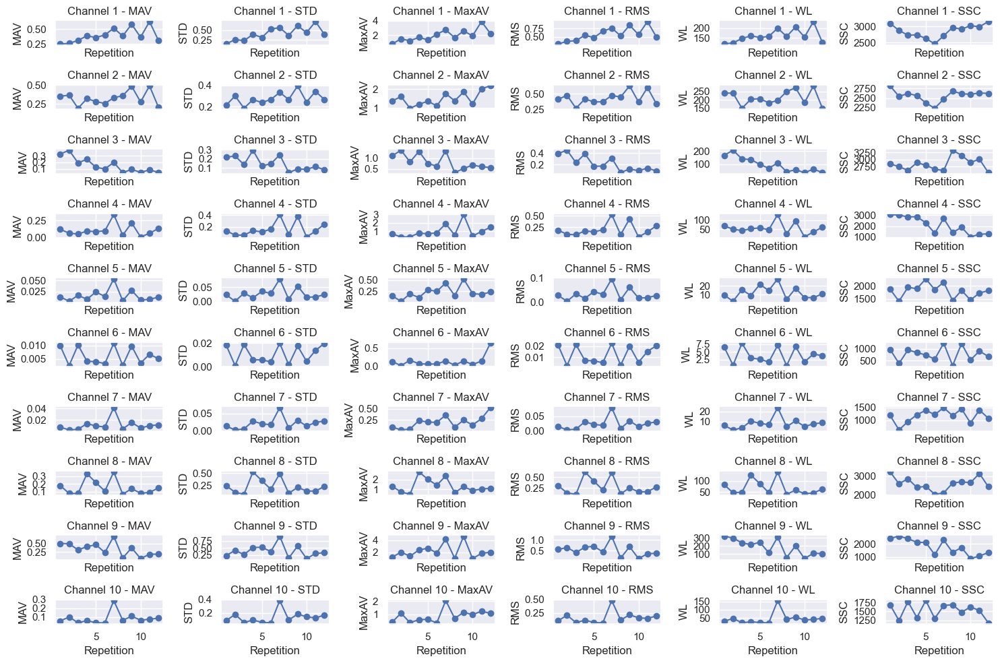

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Plotting features for each channel across repetitions
fig, axes = plt.subplots(n_channels, 7, figsize=(15, 10), sharex=True, sharey=True)

# List of feature names for easier iteration
feature_names = ["MAV", "STD", "MaxAV", "RMS", "WL", "SSC", "Ceps"]

# Normalize a list of values using min-max scaling
def normalize(values):
    values = np.array(values)
    return (values - values.min()) / np.ptp(values) if np.ptp(values) > 0 else values


# Loop through each channel
for i in range(n_channels):
    # Loop through each feature
    for j, feature_name in enumerate(feature_names):
        # Extract the feature values for the current channel and all repetitions
        feature_values = [features[f"Repetition {rep+1}"][f"Channel {i+1}"][feature_name] for rep in range(n_repetitions)]
        
        # Normalize the feature values
        normalized_values = normalize(feature_values)
        
        # Plot the normalized feature values for the current channel
        axes[i, j].plot(range(1, n_repetitions + 1), normalized_values, marker='o', color='b')
        axes[i, j].set_title(f"Channel {i+1} - {feature_name}")
        axes[i, j].set_xlabel('Repetition')
        axes[i, j].set_ylabel(feature_name)

# Adjust layout
plt.tight_layout()
plt.show()


#### Possible Reasons for Similarity/Discrepancies:
- For Similarity:
    - For repetitions: The similarity in feature values is it be due to consistent stimulus presentation and fixed recording parameters.
- For Discrepancies:
    - For repetitions: Variations in repetition values might be due to small variations in electrode positioning, environmental noise, or also fatigue of the patient.
    - For channels: Differences between channels could be attributed to the position of them, variations in signal propagation paths, and noise effects from different sources affecting certain channels more than others.

## 4. Perform classification using GradientBoostingClassifier

Baseline, with no cross validation, just take default values of GBC and the dataset as it is

Balanced Accuracy Score: 0.75
Accuracy Score: 0.75
F1 Score: 0.7000


Text(0.5, 20.049999999999997, 'Predicted label')

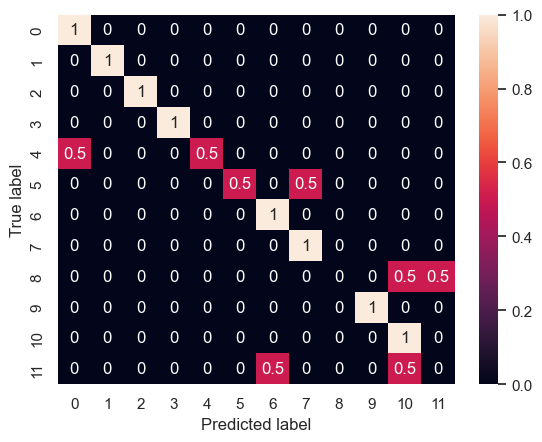

In [36]:
#no cross validation

from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.metrics import balanced_accuracy_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Train a classifier on the normalized data
clf = GradientBoostingClassifier(random_state=42) # using default parameters
clf.fit(X_train_z, y_train)  # Fit the model on the training data and labels

# Predict the labels for the test set
y_pred = clf.predict(X_test_z)  # Use the 'predict' method to get predicted labels

# Calculate balanced accuracy
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced Accuracy Score: {balanced_accuracy}")
accuracy_score = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy_score}")
f1_score = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score: {f1_score:.4f}")

# Create a confusion matrix to visualize the performance of the classification
# The confusion matrix shows the true vs predicted labels
confmat = confusion_matrix(y_test, y_pred, normalize="true")
fig, ax = plt.subplots()
sns.heatmap(confmat, annot=True, ax=ax)  # Use seaborn to create a heatmap of the confusion matrix
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")

Using cross validation for tuning GradientBoostingClassifier parameters, in order to increase the model's performance

In [37]:
# use cross validation to find the best hyperparameters for SVC
from sklearn.metrics import balanced_accuracy_score, accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for GradientBoostingClassifier
param_grid = {
    'n_estimators': [100, 120, 150],
    'learning_rate': [0.01, 0.05],
    'max_depth': [5, 7, 9],
    'subsample': [0.7, 0.8, 0.9],
}

# Create the GridSearchCV object with GradientBoostingClassifier and the parameter grid
clf = GradientBoostingClassifier(random_state=42)
grid = GridSearchCV(clf, param_grid, cv=5, scoring='balanced_accuracy')  # 5-fold cross-validation

# Fit the grid search to the training data (dataset and labels should be defined earlier)
grid.fit(X_train_z, y_train)

# Get the best model and hyperparameters
print(f"Best estimator: {grid.best_estimator_}")
print(f"Best hyperparameters: {grid.best_params_}")

# Make predictions using the best model
y_pred = grid.best_estimator_.predict(X_test_z)  # Use the best estimator to predict

# Calculate the accuracy of the best model
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Balanced accuracy score of best model: {balanced_accuracy}")
print(f"Accuracy score of best model: {accuracy}")
print(f"F1 score of best model: {f1:.4f}")


Best estimator: GradientBoostingClassifier(learning_rate=0.05, max_depth=5, n_estimators=120,
                           random_state=42, subsample=0.9)
Best hyperparameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 120, 'subsample': 0.9}
Balanced accuracy score of best model: 0.8333333333333334
Accuracy score of best model: 0.8333333333333334
F1 score of best model: 0.7944


## 5. Evaluate the performance using a metric of your choice.

We inspected the performance of our model using accuracy, balanced accuracy and F1 score. Accuracy is a perfect metric when the datasets (cross validation and test) are balanced, while if the datataset is not balanced, the accuracy metric will favour the most representative class. We splitted our dataset in train and test in a balanced way, but inside the cross validation the dataset are not strictly balanced, so we tried with the 'balanced_accuracy' metric, because it takes into acccount the unbalance of the dataset. F1-score is another metric that is usually considered in case of unbalanced dataset. Anyway we chose 'balanced accuracy' as our evaluation metric.

## 6. Perform feature selection / dimension reduction using 2 methods of your choice.

#### a. Mutual Information
#### b. PCA
#### c. Recursive Feature Elimination (RFE)

a. Mutual Information with optimal parameters for GradientBoostingClassifier, looking for the optimal number of features

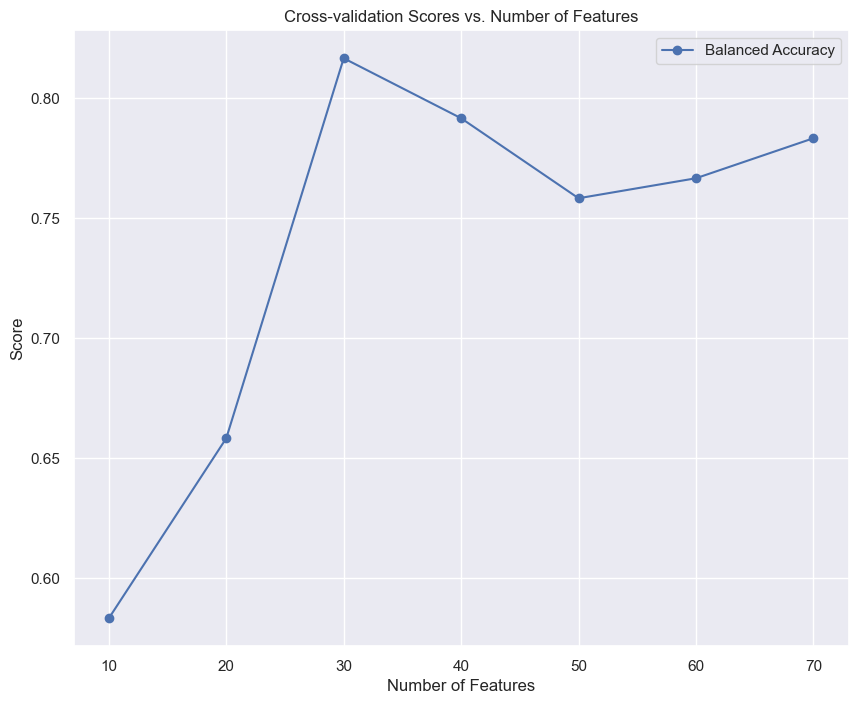

The best number of features based on cross-validation: 30
Indices of selected features: [ 0  2  3  4  8 10 12 13 14 17 18 20 22 23 27 28 29 30 32 33 34 37 38 42
 43 44 45 46 47 48]
Balanced accuracy score of a model with SelectKBest(k=30, score_func=<function mutual_info_classif at 0x16dc22200>) best features: 0.8333333333333334


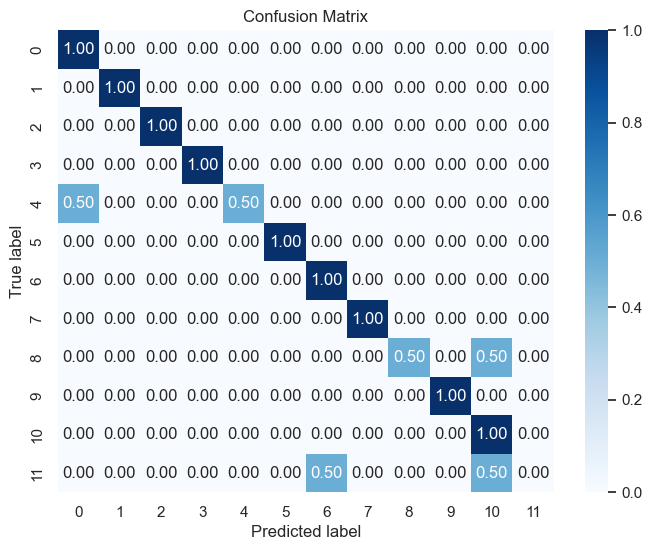

In [38]:
from sklearn.feature_selection import mutual_info_classif, SelectKBest
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score

# Calculate mutual information between each feature and the target variable.
mutual_info = mutual_info_classif(X_train_z, y_train)

# Initialize the classifier (using the best parameters found from previous grid search)
clf = GradientBoostingClassifier(**grid.best_params_, random_state=42) 

feature_range = [10, 20, 30, 40, 50, 60, 70] 

cv_scores_bal_acc = []  # List to store the cross-validation scores

for k in feature_range:
    # Select k best features based on mutual information
    selector = SelectKBest(mutual_info_classif, k=k)
    X_train_k_best = selector.fit_transform(X_train_z, y_train)
    
    # Perform cross-validation to evaluate the model
    scores_bal_acc = cross_val_score(clf, X_train_k_best, y_train, cv=5, scoring='balanced_accuracy')
    cv_scores_bal_acc.append(np.mean(scores_bal_acc))

# Plot the cross-validation scores against the number of features
plt.figure(figsize=(10, 8))
plt.plot(feature_range, cv_scores_bal_acc, marker='o', color='b', label='Balanced Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Score')
plt.title('Cross-validation Scores vs. Number of Features')
plt.xticks(feature_range)
plt.grid(True)
plt.legend()
plt.show()


# Find the optimal number of features that gives the best cross-validation score
best_k = feature_range[np.argmax(cv_scores_bal_acc)]
print(f"The best number of features based on cross-validation: {best_k}")

# Select the top 'best_k' features based on mutual information
k_best = SelectKBest(mutual_info_classif, k=best_k)
k_best.fit(X_train_z, y_train)

# Print the selected features (their indices and scores)
selected_features = k_best.get_support(indices=True)
print(f"Indices of selected features: {selected_features}")
#print(f"Scores of the selected features: {mutual_info[selected_features]}")

# Transform the training and test datasets to only include the selected features.
X_train_best = k_best.transform(X_train_z)
X_test_best = k_best.transform(X_test_z)

# Train the classifier with the selected features
clf.fit(X_train_best, y_train)

# Predict the labels for the test set using the trained model
y_pred = clf.predict(X_test_best)

# Calculate the accuracy of the model with the selected features.
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced accuracy score of a model with {k_best} best features: {balanced_accuracy}")

# Create a confusion matrix to visualize the performance of the classification model
confmat = confusion_matrix(y_test, y_pred, normalize="true")

# Plot the confusion matrix using a heatmap for better visualization
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=True, fmt=".2f", cmap="Blues", ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title("Confusion Matrix")
plt.show()

2. PCA with optimal parameters for GradientBoostingClassifier and k=40 final features

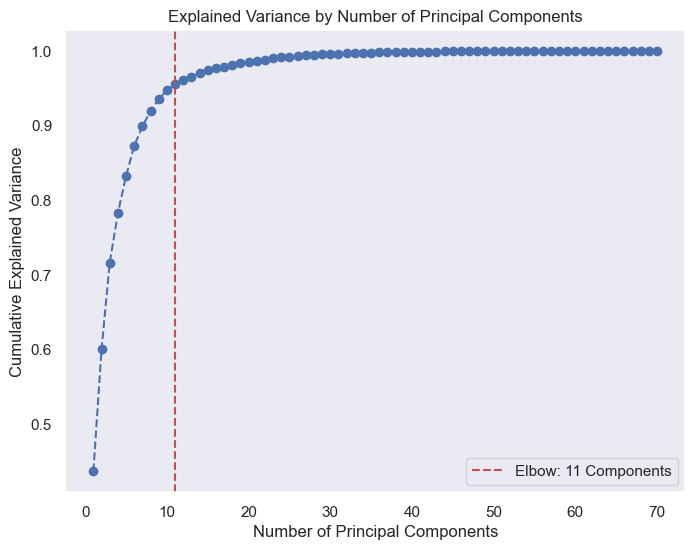

The optimal number of components to retain 95% of variance: 11


In [41]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Fit PCA to the training data to compute the explained variance
pca_full = PCA()
pca_full.fit(X_train_z)

# Calculate the cumulative explained variance ratio
cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# Plot the cumulative explained variance to find the "elbow"
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--', color='b')
plt.title('Explained Variance by Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()

# Highlight the elbow point (optional: could be automated or visually inspected)
elbow_index = np.argmax(cumulative_variance >= 0.95) + 1  # First component where >= 95% variance is retained
plt.axvline(x=elbow_index, color='r', linestyle='--', label=f'Elbow: {elbow_index} Components')
plt.legend()

plt.show()

# Print the optimal number of components based on the elbow method
print(f"The optimal number of components to retain 95% of variance: {elbow_index}")


Explained variance ratio by the components: [0.43690238 0.16351741 0.11587888 0.06654389 0.04970027 0.0407074
 0.0259443  0.02035832 0.01616241 0.01185247 0.0080411 ]
Total variance explained by the PCA components: 0.9556
Balanced accuracy score of the model using PCA with 11 components: 0.8333333333333334


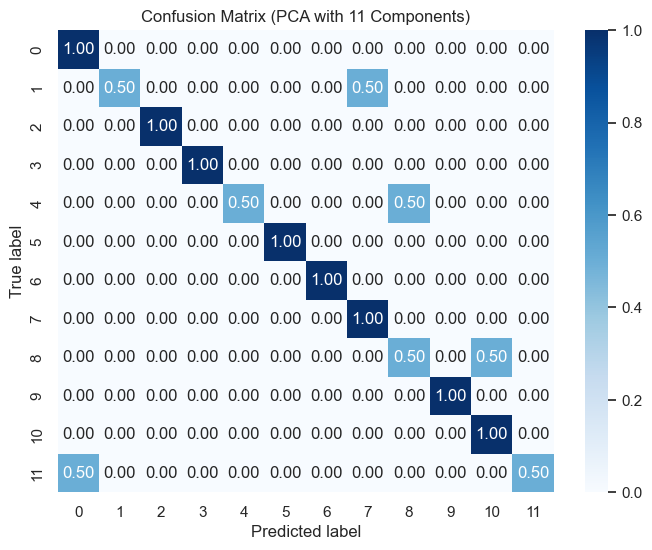

In [39]:
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import balanced_accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Perform PCA on the training data
pca = PCA(n_components=0.95)  # Retain 95% of the variance
X_train_pca = pca.fit_transform(X_train_z)  # Apply PCA and transform the training data

# Transform the test data using the same PCA transformation
X_test_pca = pca.transform(X_test_z)  # Use the same PCA transformation to transform test data

# Print the explained variance ratio to understand how much variance is captured by each component
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained variance ratio by the components: {explained_variance_ratio}")
print(f"Total variance explained by the PCA components: {sum(explained_variance_ratio):.4f}")

# Initialize GradientBoostingClassifier with the best parameters found from previous grid search
clf = GradientBoostingClassifier(**grid.best_params_, random_state=42)

# Train the classifier with the transformed data from PCA
clf.fit(X_train_pca, y_train)

# Predict the labels for the test set using the trained model
y_pred = clf.predict(X_test_pca)

# Calculate the accuracy of the model with the PCA-transformed features
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced accuracy score of the model using PCA with {pca.n_components_} components: {balanced_accuracy}")

# Create a confusion matrix to visualize the performance of the classification model
confmat = confusion_matrix(y_test, y_pred, normalize="true")

# Plot the confusion matrix using a heatmap for better visualization
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=True, fmt=".2f", cmap="Blues", ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title(f"Confusion Matrix (PCA with {pca.n_components_} Components)")
plt.show()


3. RFE with optimal parameters for GradientBoostingClassifier, looking for the optimal number of features

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best number of features to select: 60
Test set balanced accuracy score: 0.8333


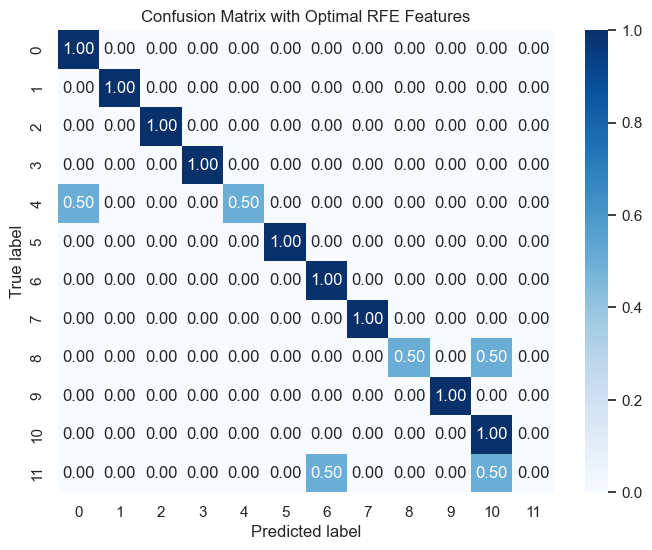

In [40]:
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline

# Initialize the Gradient Boosting Classifier
clf = GradientBoostingClassifier(**grid.best_params_, random_state=42)

# Define the parameter grid for GridSearchCV to find the optimal number of features
param_grid = {
    'rfe__n_features_to_select':  [10, 20, 30, 40, 50, 60] 
}

# Initialize RFE and GradientBoostingClassifier in a pipeline
pipeline = Pipeline([
    ('rfe', RFE(estimator=clf)),  # RFE step with Gradient Boosting as estimator
    ('clf', clf)  # Classifier step
])

# Perform Grid Search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='balanced_accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_train_z, y_train)  # Fit the grid search to the training data

# Best parameters and best score found by GridSearchCV
print(f"Best number of features to select: {grid_search.best_params_['rfe__n_features_to_select']}")

# Use the best model from GridSearchCV to predict the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_z)

# Calculate accuracy on the test set
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Test set balanced accuracy score: {balanced_accuracy:.4f}")

# Create a confusion matrix to visualize the model's performance on the test set
confmat = confusion_matrix(y_test, y_pred, normalize='true')

# Plot the confusion matrix using a heatmap
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=True, fmt=".2f", cmap="Blues", ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title(f"Confusion Matrix with Optimal RFE Features")
plt.show()